In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

from keras.datasets import mnist
from keras.layers import Input, Dense, Reshape, Flatten, Dropout,Conv2DTranspose
from keras.layers import BatchNormalization, Activation, ZeroPadding2D
from keras.layers.advanced_activations import LeakyReLU
from keras.layers.convolutional import UpSampling2D, Conv2D
from keras.models import Sequential, Model
from keras.optimizers import Adam

import matplotlib.pyplot as plt
from random import randint
import sys, gc, time, shutil 

from keras.preprocessing.image import ImageDataGenerator

# Any results you write to the current directory are saved as output.

['sample']


Using TensorFlow backend.


In [2]:
class DCGAN():
    def __init__(self, sample_size):
        # Input shape
        self.img_rows = 64
        self.img_cols = 64
        self.channels = 3
        self.img_shape = (self.img_rows, self.img_cols, self.channels)
        self.latent_dim = 100
        self.PATH = '../input/sample/data0/lsun/bedroom'
        self.SAMPLE_SIZE = sample_size
        optimizer = Adam(0.00015, 0.5)
        
#       Remove the existing with old data and create new deirectory
        self.output_dir = 'output'        
        if os.path.exists(self.output_dir):
            shutil.rmtree(self.output_dir)        
            os.mkdir(self.output_dir)
        else:
            os.mkdir(self.output_dir)
        # Build and compile the discriminator
        self.discriminator = self.build_discriminator()
        self.discriminator.compile(loss='binary_crossentropy',
            optimizer=optimizer,
            metrics=['accuracy'])

        # Build the generator
        self.generator = self.build_generator()

        # The generator takes noise as input and generates imgs
        z = Input(shape=(1,1,self.latent_dim))
        img = self.generator(z)

        # For the combined model we will only train the generator
        self.discriminator.trainable = False

        # The discriminator takes generated images as input and determines validity
        valid = self.discriminator(img)

        # The combined model  (stacked generator and discriminator)
        # Trains the generator to fool the discriminator
        self.combined = Model(z, valid)
        self.combined.compile(loss='binary_crossentropy', optimizer=optimizer)

    def build_generator(self):
        generator = Sequential()

        generator.add(Dense(units=4 * 4 * 512, kernel_initializer='glorot_uniform', input_shape=(1, 1, self.latent_dim)))
        generator.add(Reshape(target_shape=(4, 4, 512)))
        generator.add(BatchNormalization(momentum=0.5))
        generator.add(Activation('relu'))

        generator.add(Conv2DTranspose(filters=256, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
        generator.add(BatchNormalization(momentum=0.5))
        generator.add(Activation('relu'))

        generator.add(Conv2DTranspose(filters=128, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
        generator.add(BatchNormalization(momentum=0.5))
        generator.add(Activation('relu'))

        generator.add(Conv2DTranspose(filters=64, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
        generator.add(BatchNormalization(momentum=0.5))
        generator.add(Activation('relu'))

        generator.add(Conv2DTranspose(filters=3, kernel_size=(5, 5),
                                  strides=(2, 2), padding='same',
                                  data_format='channels_last',
                                  kernel_initializer='glorot_uniform'))
        generator.add(Activation('tanh'))
      
        print('generator summary')
        generator.summary()
        return generator



    def build_discriminator(self):

        discriminator = Sequential()
        discriminator.add(Conv2D(filters=64, kernel_size=(5, 5),
                                 strides=(2, 2), padding='same',
                                 data_format='channels_last',
                                 kernel_initializer='glorot_uniform',
                                 input_shape=(self.img_shape)))
        discriminator.add(LeakyReLU(0.2))

        discriminator.add(Conv2D(filters=128, kernel_size=(5, 5),
                                 strides=(2, 2), padding='same',
                                 data_format='channels_last',
                                 kernel_initializer='glorot_uniform'))
        discriminator.add(BatchNormalization(momentum=0.5))
        discriminator.add(LeakyReLU(0.2))

        discriminator.add(Conv2D(filters=256, kernel_size=(5, 5),
                                 strides=(2, 2), padding='same',
                                 data_format='channels_last',
                                 kernel_initializer='glorot_uniform'))
        discriminator.add(BatchNormalization(momentum=0.5))
        discriminator.add(LeakyReLU(0.2))

        discriminator.add(Conv2D(filters=512, kernel_size=(5, 5),
                                 strides=(2, 2), padding='same',
                                 data_format='channels_last',
                                 kernel_initializer='glorot_uniform'))
        discriminator.add(BatchNormalization(momentum=0.5))
        discriminator.add(LeakyReLU(0.2))

        discriminator.add(Flatten())
        discriminator.add(Dense(1))
        discriminator.add(Activation('sigmoid'))
        
        
        print('discriminator summary')
        discriminator.summary()
        return discriminator

        

        

    def train(self, epochs, batch_size=128, save_interval= 50):
        g_losses = []
        d_losses = []

        # Load the dataset with image size 128 128 3
        X_train = self.load_data()        
        self.display_random_images(X_train)

        #Number of batches = number of images divided by bath_size 
        number_of_batches = int(X_train.shape[0] / batch_size)
        print('No of samples', X_train.shape[0], '#No of batches', number_of_batches, 'Batch Size', batch_size)
        
        
        for epoch in range(epochs):
            start_time = time.time() 
            starting_idx = 0
            print("Epoch {} of {}".format(epoch+1, epochs))
            for batch_number in range(number_of_batches):    
                
#               We could have generator.nexts() here for batches but it increases run time by almost 4 times
#                 real_images = X_train[starting_idx: starting_idx + batch_size]
#               get the data for current batch of bath_size 
                real_images, starting_idx = self.get_next_batch(starting_idx, batch_number, number_of_batches, batch_size, X_train)
               
                
#               The actual batch size is given by the number of samples in data as the last batch will have more number
#               of images than batch_size
                current_batch_size = real_images.shape[0]
               
        
#               Generate noise of shape (current_batcg size, 1, 1 , 100)
                noise = np.random.normal(0, 1, size=(current_batch_size,) + (1, 1, self.latent_dim))
    
#               Generate Fake images
                generated_images = self.generator.predict(noise)
    
#               Add some noise to the labels that will be fed to the discriminator
#               real_y will have random values from 0.8 to 1 and fake_y will have random values from 0 to 0.2
                real_y = (np.ones(current_batch_size) - np.random.random_sample(current_batch_size) * 0.2)
                fake_y = np.random.random_sample(current_batch_size) * 0.2
                
#                Discrimnator is trained in real and fake images
                self.discriminator.trainable = True
                d_loss_real = self.discriminator.train_on_batch(real_images, real_y)
                d_loss_fake = self.discriminator.train_on_batch(generated_images, fake_y)
                d_loss = 0.5 * np.add(d_loss_real, d_loss_fake)
                
                
#               Train the generator such that the fake samples generated as passed as Real to discriminator. Goal is to
#               let discriminator evaluate the fake images as real while weights are not updated at the same time
                self.discriminator.trainable = False
                noise = np.random.normal(0, 1, size=(current_batch_size * 2,) +  (1, 1, self.latent_dim))
#               Fake labels are passed as real
                fake_y = (np.ones(current_batch_size * 2) - np.random.random_sample(current_batch_size * 2) * 0.2)
                g_loss = self.combined.train_on_batch(noise, fake_y)       
#          
                
#           Plot the progress after every epoch
            d_losses.append(d_loss[0])
            g_losses.append(g_loss)
            print ("%d [D loss: %f, acc.: %.2f%%] [G loss: %f]" % (epoch+1, d_loss[0], 100*d_loss[1], g_loss))
            print('Time Elapsed {:0.2f}'.format(time.time() - start_time))
            self.save_imgs(epoch, show_fig = False) 
            
            
#           Display Imgaes and Grapth every 10 Epochs
            if  (epoch+1) % save_interval == 0:
               self.save_imgs(epoch, show_fig = True)
               self.display_losses(epoch, d_losses, g_losses)
             


    def save_imgs(self, epoch, show_fig = False):
        r, c = 5, 5
#         noise = np.random.normal(0, 1, (r * c, self.latent_dim))
        noise = np.random.normal(0, 1, size=(r*c,) +  (1, 1, self.latent_dim))
        gen_imgs = self.generator.predict(noise)

        # Rescale images 0 - 256        
        gen_imgs = (255*(gen_imgs - np.min(gen_imgs))/np.ptp(gen_imgs)).astype(int)
        
        plt.figure(figsize=(8,8))       

        for i in range(r*c):            
            plt.subplot(r, c, i+1)
            plt.imshow(gen_imgs[i, :,:,:])
            plt.axis('off')
        
        if show_fig:
            plt.show()
        else: 

            filename = "image_%d.png" % epoch
            plt.savefig(os.path.join(self.output_dir,filename ))
        plt.close()
        
    def display_losses(self,epoch, d_loss, g_loss):    
        epochs = list(range(0, epoch + 1))
        plt.figure(figsize = (12, 6))
        plt.ylim(0,3)
        plt.plot(epochs,  d_loss, color = 'red', label = 'Discriminator Loss')
        plt.plot(epochs , g_loss, color = 'blue', label = 'Generator Loss')        
        plt.legend()
        plt.show()

    def load_data(self):
        dataset_generator = ImageDataGenerator()
        dataset_generator = dataset_generator.flow_from_directory( self.PATH, 
                                                                   target_size=(self.img_rows, self.img_cols),
                                                                   batch_size= self.SAMPLE_SIZE, 
                                                                   class_mode=None)
#       get only the first batch of images and return it so that we train only on a subset of images
        X_train = dataset_generator.next()
#       rescale images between -1 to 1
        X_train = (X_train.astype(np.float32) -127.5)/127.5  
        return X_train   
   
    def display_random_images(self, X_train):
        plt.figure(figsize=(12,12))
        for i in range(64):
            plt.subplot(8,8,i+1)
            random_idx = randint(0, X_train.shape[0] -1)
            image = X_train[random_idx,:,:,:]
             # Rescale images 0 - 256        
            image = (255*(image - np.min(image))/np.ptp(image)).astype(int)
            plt.axis('off')
            plt.imshow(image)
        plt.show()
        
    def get_next_batch(self, starting_idx,batch_number, number_of_batches, batch_size,  data):
#         Return the data for current batch
        #if its the last batch then ending index is last index of data
        if (batch_number +1) ==  number_of_batches:
            ending_idx = data.shape[0]
        else:
            ending_idx = starting_idx + batch_size  
        
        return data[starting_idx:ending_idx], starting_idx + batch_size

Instructions for updating:
Colocations handled automatically by placer.
discriminator summary
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 32, 32, 64)        4864      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 32, 32, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 16, 16, 128)       204928    
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 128)       512       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 16, 16, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 8, 8, 256)         819456    
________________________________________________

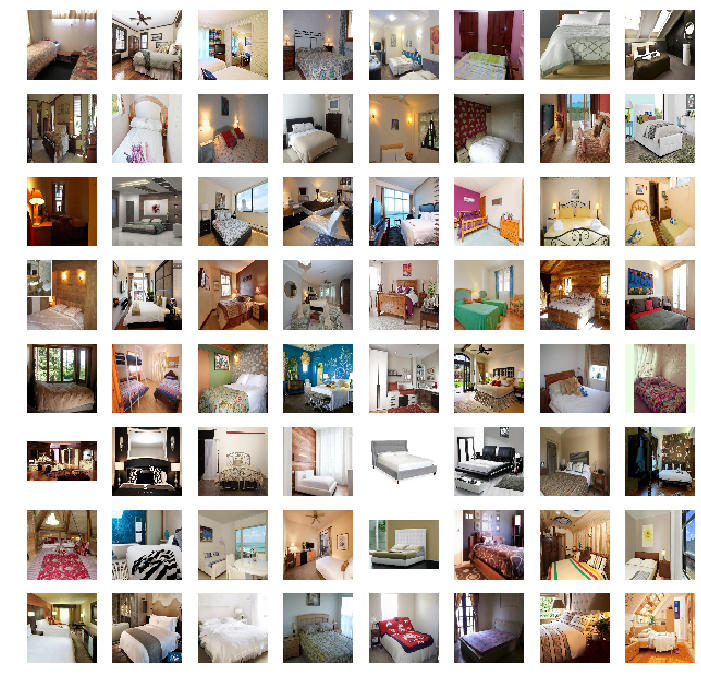

No of samples 5000 #No of batches 78 Batch Size 64
Epoch 1 of 1000
Instructions for updating:
Use tf.cast instead.
1 [D loss: 0.814427, acc.: 0.00%] [G loss: 12.877887]
Time Elapsed 15.42
Epoch 2 of 1000
2 [D loss: 0.710950, acc.: 0.00%] [G loss: 1.864948]
Time Elapsed 8.65
Epoch 3 of 1000
3 [D loss: 0.564560, acc.: 0.00%] [G loss: 3.121922]
Time Elapsed 8.69
Epoch 4 of 1000
4 [D loss: 0.469115, acc.: 0.00%] [G loss: 2.443899]
Time Elapsed 8.67
Epoch 5 of 1000
5 [D loss: 0.441670, acc.: 0.00%] [G loss: 2.294707]
Time Elapsed 8.64
Epoch 6 of 1000
6 [D loss: 0.486355, acc.: 0.00%] [G loss: 2.699464]
Time Elapsed 8.65
Epoch 7 of 1000
7 [D loss: 0.389542, acc.: 0.00%] [G loss: 2.391212]
Time Elapsed 8.63
Epoch 8 of 1000
8 [D loss: 0.407990, acc.: 0.00%] [G loss: 1.901632]
Time Elapsed 8.66
Epoch 9 of 1000
9 [D loss: 0.606193, acc.: 0.00%] [G loss: 3.041705]
Time Elapsed 8.65
Epoch 10 of 1000
10 [D loss: 0.473684, acc.: 0.00%] [G loss: 2.190830]
Time Elapsed 8.66


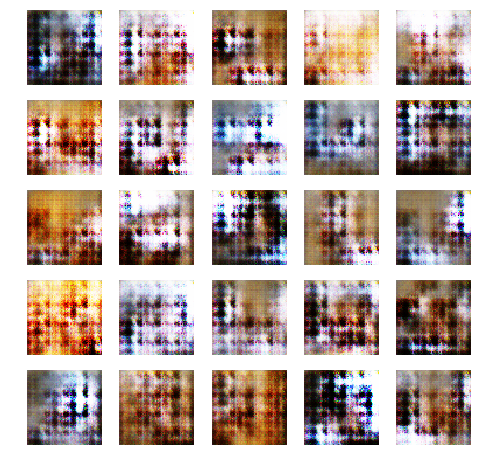

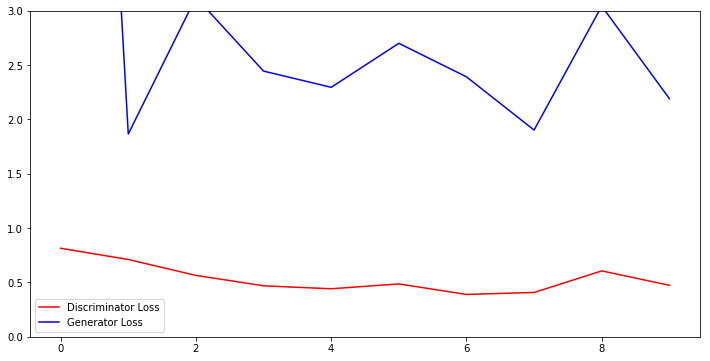

Epoch 11 of 1000
11 [D loss: 0.456092, acc.: 0.00%] [G loss: 2.190572]
Time Elapsed 8.64
Epoch 12 of 1000
12 [D loss: 0.408472, acc.: 0.00%] [G loss: 2.336130]
Time Elapsed 8.67
Epoch 13 of 1000
13 [D loss: 0.563895, acc.: 0.00%] [G loss: 3.798110]
Time Elapsed 8.65
Epoch 14 of 1000
14 [D loss: 0.396764, acc.: 0.00%] [G loss: 2.116824]
Time Elapsed 8.65
Epoch 15 of 1000
15 [D loss: 0.378640, acc.: 0.00%] [G loss: 0.860633]
Time Elapsed 8.70
Epoch 16 of 1000
16 [D loss: 0.403497, acc.: 0.00%] [G loss: 1.961447]
Time Elapsed 8.67
Epoch 17 of 1000
17 [D loss: 0.527822, acc.: 0.00%] [G loss: 3.492452]
Time Elapsed 8.65
Epoch 18 of 1000
18 [D loss: 0.393866, acc.: 0.00%] [G loss: 2.306507]
Time Elapsed 8.63
Epoch 19 of 1000
19 [D loss: 0.362113, acc.: 0.00%] [G loss: 1.896791]
Time Elapsed 8.64
Epoch 20 of 1000
20 [D loss: 0.529346, acc.: 0.00%] [G loss: 4.244808]
Time Elapsed 8.65


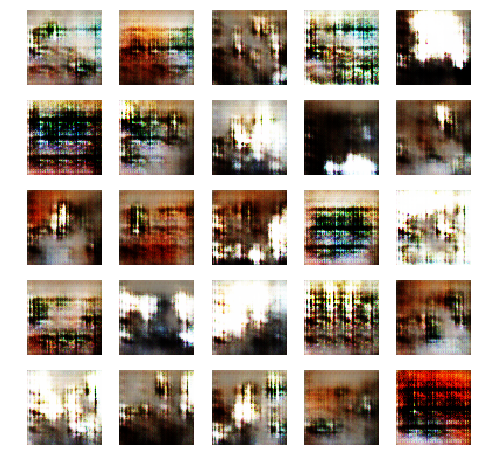

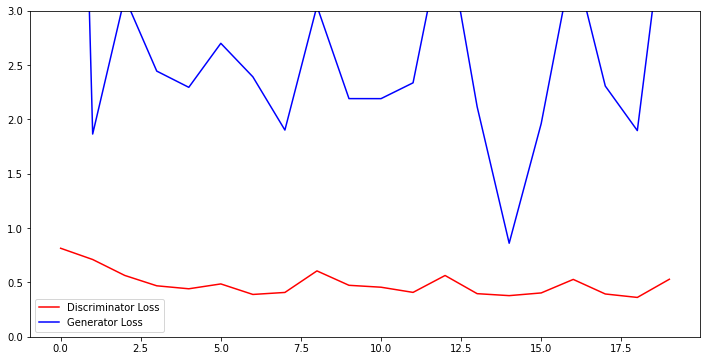

Epoch 21 of 1000
21 [D loss: 0.397261, acc.: 0.00%] [G loss: 2.474368]
Time Elapsed 8.64
Epoch 22 of 1000
22 [D loss: 0.420126, acc.: 0.00%] [G loss: 3.170177]
Time Elapsed 8.63
Epoch 23 of 1000
23 [D loss: 0.461826, acc.: 0.00%] [G loss: 2.757748]
Time Elapsed 8.64
Epoch 24 of 1000
24 [D loss: 0.414572, acc.: 0.00%] [G loss: 2.641328]
Time Elapsed 8.65
Epoch 25 of 1000
25 [D loss: 0.405129, acc.: 0.00%] [G loss: 2.552160]
Time Elapsed 8.63
Epoch 26 of 1000
26 [D loss: 0.418490, acc.: 0.00%] [G loss: 1.732346]
Time Elapsed 8.61
Epoch 27 of 1000
27 [D loss: 0.362964, acc.: 0.00%] [G loss: 2.902663]
Time Elapsed 8.64
Epoch 28 of 1000
28 [D loss: 0.442584, acc.: 0.00%] [G loss: 3.622527]
Time Elapsed 8.64
Epoch 29 of 1000
29 [D loss: 0.392231, acc.: 0.00%] [G loss: 2.067216]
Time Elapsed 8.67
Epoch 30 of 1000
30 [D loss: 0.479304, acc.: 0.00%] [G loss: 4.349269]
Time Elapsed 8.69


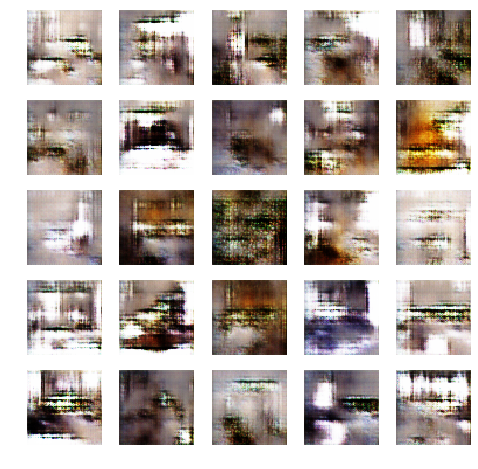

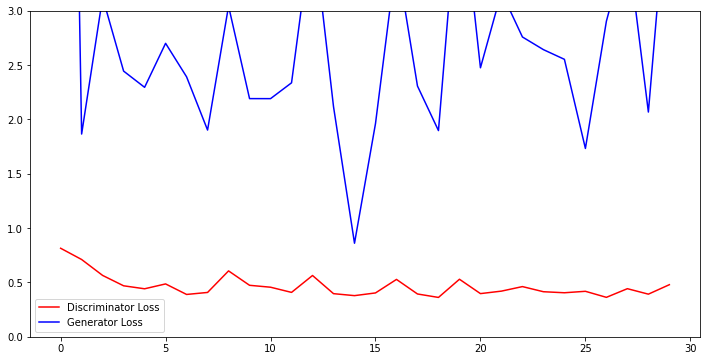

Epoch 31 of 1000
31 [D loss: 0.413279, acc.: 0.00%] [G loss: 2.136659]
Time Elapsed 8.69
Epoch 32 of 1000
32 [D loss: 0.409681, acc.: 0.00%] [G loss: 2.903649]
Time Elapsed 8.73
Epoch 33 of 1000
33 [D loss: 0.461120, acc.: 0.00%] [G loss: 2.346121]
Time Elapsed 8.70
Epoch 34 of 1000
34 [D loss: 0.354571, acc.: 0.00%] [G loss: 1.998354]
Time Elapsed 8.69
Epoch 35 of 1000
35 [D loss: 0.358390, acc.: 0.00%] [G loss: 2.422513]
Time Elapsed 8.71
Epoch 36 of 1000
36 [D loss: 0.439007, acc.: 0.00%] [G loss: 3.339476]
Time Elapsed 8.72
Epoch 37 of 1000
37 [D loss: 0.386814, acc.: 0.00%] [G loss: 3.029485]
Time Elapsed 8.72
Epoch 38 of 1000
38 [D loss: 0.372016, acc.: 0.00%] [G loss: 2.933797]
Time Elapsed 8.68
Epoch 39 of 1000
39 [D loss: 0.498708, acc.: 0.00%] [G loss: 3.897933]
Time Elapsed 8.71
Epoch 40 of 1000
40 [D loss: 0.452119, acc.: 0.00%] [G loss: 2.099951]
Time Elapsed 8.68


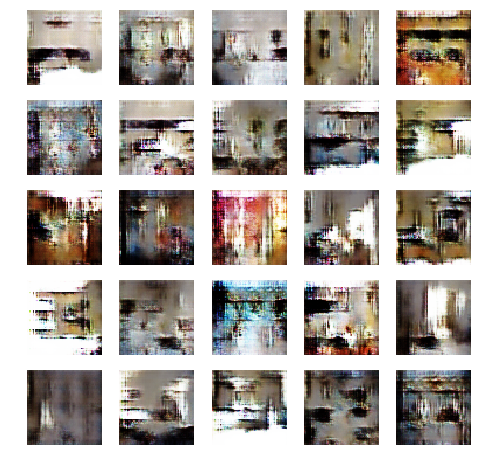

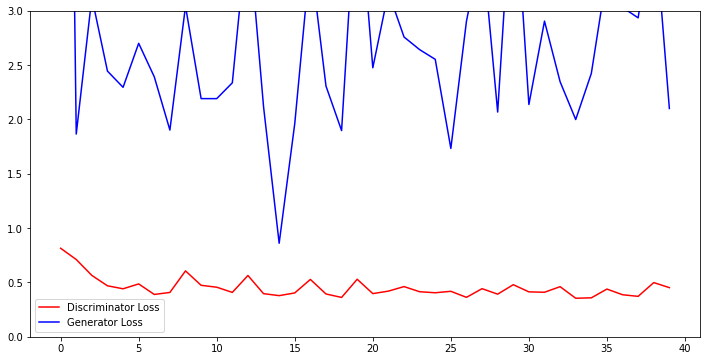

Epoch 41 of 1000
41 [D loss: 0.386936, acc.: 0.00%] [G loss: 2.732209]
Time Elapsed 8.66
Epoch 42 of 1000
42 [D loss: 0.390171, acc.: 0.00%] [G loss: 2.361399]
Time Elapsed 8.70
Epoch 43 of 1000
43 [D loss: 0.422189, acc.: 0.00%] [G loss: 3.452747]
Time Elapsed 8.72
Epoch 44 of 1000
44 [D loss: 0.409139, acc.: 0.00%] [G loss: 2.136897]
Time Elapsed 8.69
Epoch 45 of 1000
45 [D loss: 0.361455, acc.: 0.00%] [G loss: 2.325876]
Time Elapsed 8.69
Epoch 46 of 1000
46 [D loss: 0.424337, acc.: 0.00%] [G loss: 3.539384]
Time Elapsed 8.68
Epoch 47 of 1000
47 [D loss: 0.445853, acc.: 0.00%] [G loss: 2.696152]
Time Elapsed 8.70
Epoch 48 of 1000
48 [D loss: 0.467040, acc.: 0.00%] [G loss: 1.449314]
Time Elapsed 8.70
Epoch 49 of 1000
49 [D loss: 0.445313, acc.: 0.00%] [G loss: 2.600627]
Time Elapsed 8.64
Epoch 50 of 1000
50 [D loss: 0.367505, acc.: 0.00%] [G loss: 3.118580]
Time Elapsed 8.67


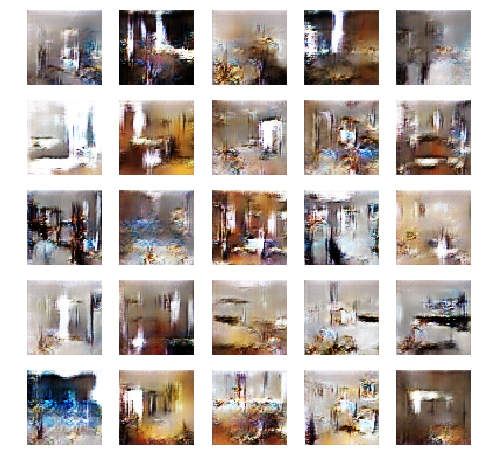

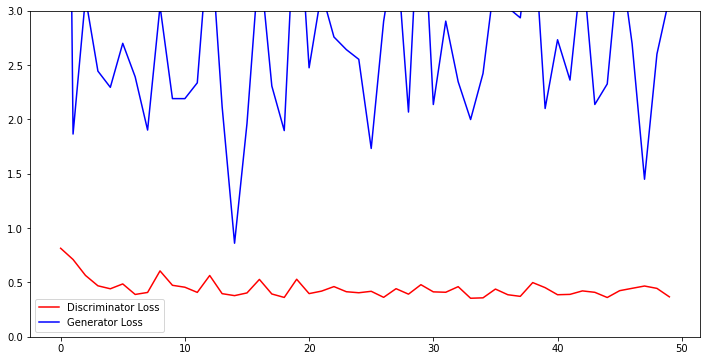

Epoch 51 of 1000
51 [D loss: 0.383661, acc.: 0.00%] [G loss: 2.373565]
Time Elapsed 8.69
Epoch 52 of 1000
52 [D loss: 0.375093, acc.: 0.00%] [G loss: 2.237403]
Time Elapsed 8.62
Epoch 53 of 1000
53 [D loss: 0.386654, acc.: 0.00%] [G loss: 2.502167]
Time Elapsed 8.66
Epoch 54 of 1000
54 [D loss: 0.325631, acc.: 0.00%] [G loss: 2.267890]
Time Elapsed 8.68
Epoch 55 of 1000
55 [D loss: 0.675051, acc.: 0.00%] [G loss: 2.169765]
Time Elapsed 8.63
Epoch 56 of 1000
56 [D loss: 0.524133, acc.: 0.00%] [G loss: 3.132515]
Time Elapsed 8.68
Epoch 57 of 1000
57 [D loss: 0.379076, acc.: 0.00%] [G loss: 2.450756]
Time Elapsed 8.68
Epoch 58 of 1000
58 [D loss: 0.377931, acc.: 0.00%] [G loss: 2.451669]
Time Elapsed 8.80
Epoch 59 of 1000
59 [D loss: 0.372455, acc.: 0.00%] [G loss: 3.116342]
Time Elapsed 8.75
Epoch 60 of 1000
60 [D loss: 0.453295, acc.: 0.00%] [G loss: 1.817283]
Time Elapsed 8.79


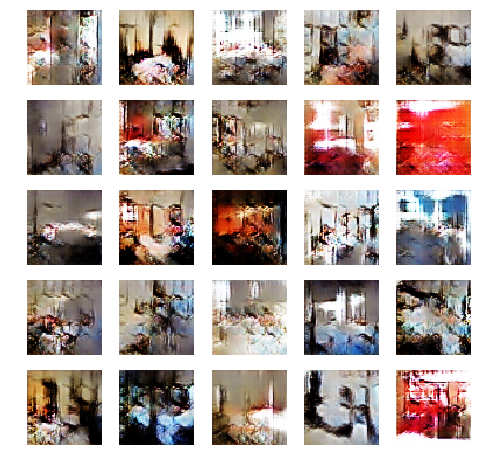

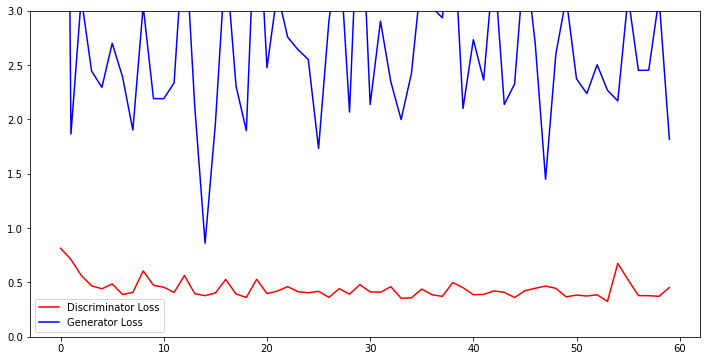

Epoch 61 of 1000
61 [D loss: 0.354553, acc.: 0.00%] [G loss: 2.795488]
Time Elapsed 8.75
Epoch 62 of 1000
62 [D loss: 0.370854, acc.: 0.00%] [G loss: 2.415651]
Time Elapsed 8.77
Epoch 63 of 1000
63 [D loss: 0.482841, acc.: 0.00%] [G loss: 2.938453]
Time Elapsed 8.71
Epoch 64 of 1000
64 [D loss: 0.373153, acc.: 0.00%] [G loss: 2.218715]
Time Elapsed 8.67
Epoch 65 of 1000
65 [D loss: 0.366617, acc.: 0.00%] [G loss: 2.122574]
Time Elapsed 8.65
Epoch 66 of 1000
66 [D loss: 0.372975, acc.: 0.00%] [G loss: 2.481918]
Time Elapsed 8.66
Epoch 67 of 1000
67 [D loss: 0.348338, acc.: 0.00%] [G loss: 2.300017]
Time Elapsed 8.95
Epoch 68 of 1000
68 [D loss: 0.361880, acc.: 0.00%] [G loss: 2.207443]
Time Elapsed 8.83
Epoch 69 of 1000
69 [D loss: 0.351711, acc.: 0.00%] [G loss: 2.391076]
Time Elapsed 8.66
Epoch 70 of 1000
70 [D loss: 0.460908, acc.: 0.00%] [G loss: 1.653400]
Time Elapsed 8.72


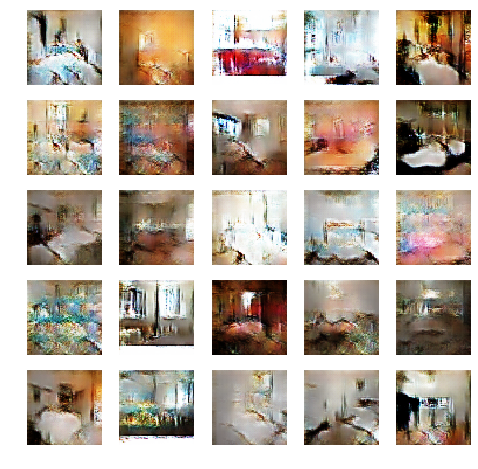

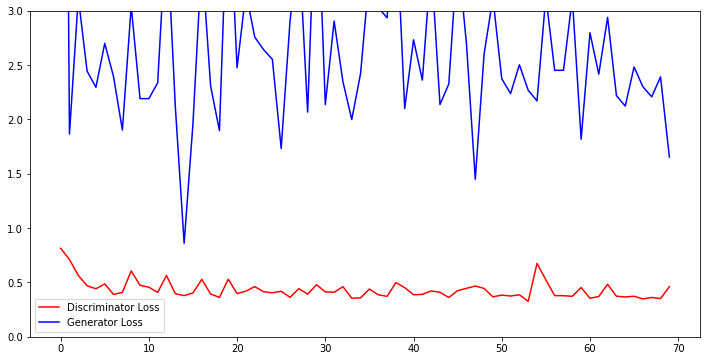

Epoch 71 of 1000
71 [D loss: 0.470600, acc.: 0.00%] [G loss: 1.872961]
Time Elapsed 8.74
Epoch 72 of 1000
72 [D loss: 0.363102, acc.: 0.00%] [G loss: 2.636537]
Time Elapsed 8.68
Epoch 73 of 1000
73 [D loss: 0.349669, acc.: 0.00%] [G loss: 2.560778]
Time Elapsed 8.72
Epoch 74 of 1000
74 [D loss: 0.353088, acc.: 0.00%] [G loss: 2.403239]
Time Elapsed 8.72
Epoch 75 of 1000
75 [D loss: 0.403803, acc.: 0.00%] [G loss: 3.419968]
Time Elapsed 8.67
Epoch 76 of 1000
76 [D loss: 0.356576, acc.: 0.00%] [G loss: 1.796504]
Time Elapsed 8.69
Epoch 77 of 1000
77 [D loss: 0.376577, acc.: 0.00%] [G loss: 2.706118]
Time Elapsed 8.67
Epoch 78 of 1000
78 [D loss: 0.402042, acc.: 0.00%] [G loss: 2.359124]
Time Elapsed 8.82
Epoch 79 of 1000
79 [D loss: 0.398461, acc.: 0.00%] [G loss: 2.106611]
Time Elapsed 8.90
Epoch 80 of 1000
80 [D loss: 0.420027, acc.: 0.00%] [G loss: 2.551133]
Time Elapsed 8.81


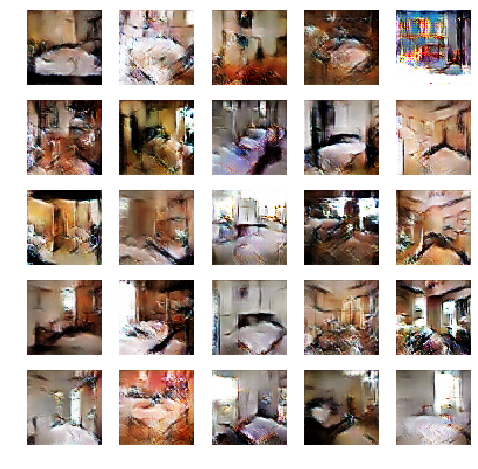

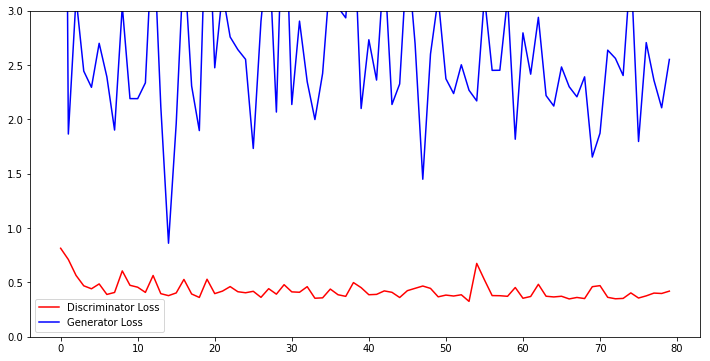

Epoch 81 of 1000
81 [D loss: 0.378975, acc.: 0.00%] [G loss: 2.374062]
Time Elapsed 8.72
Epoch 82 of 1000
82 [D loss: 0.380170, acc.: 0.00%] [G loss: 1.937706]
Time Elapsed 8.79
Epoch 83 of 1000
83 [D loss: 0.463479, acc.: 0.00%] [G loss: 4.016663]
Time Elapsed 8.83
Epoch 84 of 1000
84 [D loss: 0.392349, acc.: 0.00%] [G loss: 2.987783]
Time Elapsed 8.65
Epoch 85 of 1000
85 [D loss: 0.401845, acc.: 0.00%] [G loss: 2.786138]
Time Elapsed 8.80
Epoch 86 of 1000
86 [D loss: 0.437293, acc.: 0.00%] [G loss: 2.782009]
Time Elapsed 8.80
Epoch 87 of 1000
87 [D loss: 0.367666, acc.: 0.00%] [G loss: 1.844973]
Time Elapsed 8.89
Epoch 88 of 1000
88 [D loss: 0.428117, acc.: 0.00%] [G loss: 2.360440]
Time Elapsed 8.81
Epoch 89 of 1000
89 [D loss: 0.363752, acc.: 0.00%] [G loss: 2.596335]
Time Elapsed 8.83
Epoch 90 of 1000
90 [D loss: 0.362391, acc.: 0.00%] [G loss: 2.492993]
Time Elapsed 8.80


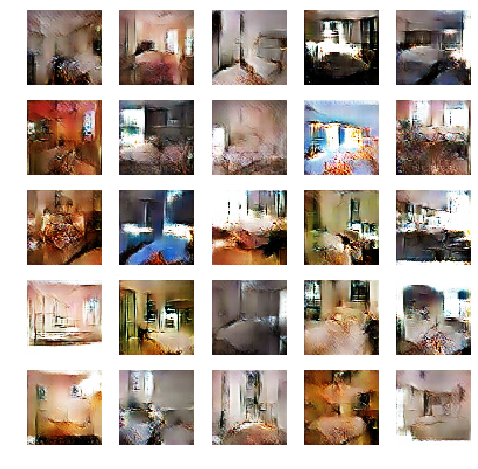

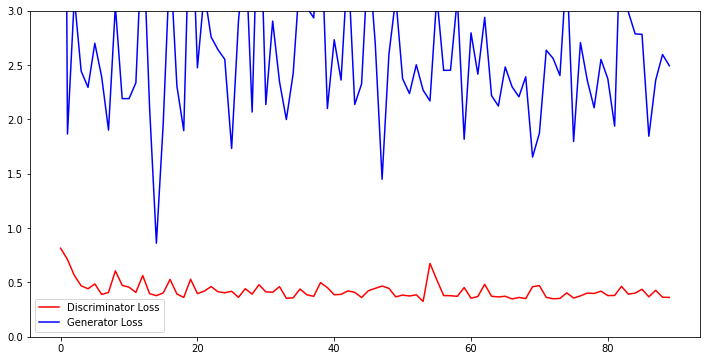

Epoch 91 of 1000
91 [D loss: 0.371082, acc.: 0.00%] [G loss: 3.301397]
Time Elapsed 8.89
Epoch 92 of 1000
92 [D loss: 0.397184, acc.: 0.00%] [G loss: 2.343013]
Time Elapsed 8.81
Epoch 93 of 1000
93 [D loss: 0.381559, acc.: 0.00%] [G loss: 2.889330]
Time Elapsed 8.85
Epoch 94 of 1000
94 [D loss: 0.403988, acc.: 0.00%] [G loss: 2.011446]
Time Elapsed 8.83
Epoch 95 of 1000
95 [D loss: 0.343377, acc.: 0.00%] [G loss: 2.264976]
Time Elapsed 8.78
Epoch 96 of 1000
96 [D loss: 0.380144, acc.: 0.00%] [G loss: 1.983827]
Time Elapsed 8.83
Epoch 97 of 1000
97 [D loss: 0.375486, acc.: 0.00%] [G loss: 2.277311]
Time Elapsed 8.75
Epoch 98 of 1000
98 [D loss: 0.371114, acc.: 0.00%] [G loss: 2.714024]
Time Elapsed 8.79
Epoch 99 of 1000
99 [D loss: 0.356779, acc.: 0.00%] [G loss: 2.091348]
Time Elapsed 8.79
Epoch 100 of 1000
100 [D loss: 0.356327, acc.: 0.00%] [G loss: 2.319848]
Time Elapsed 8.77


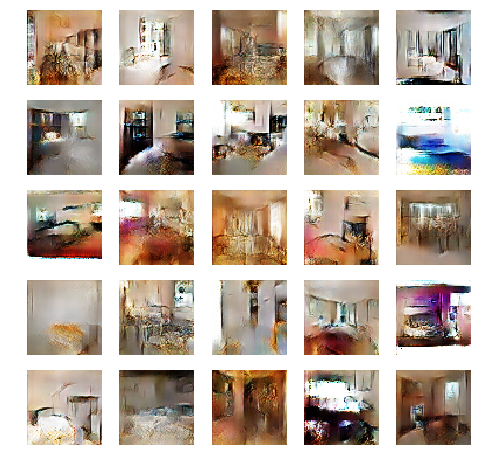

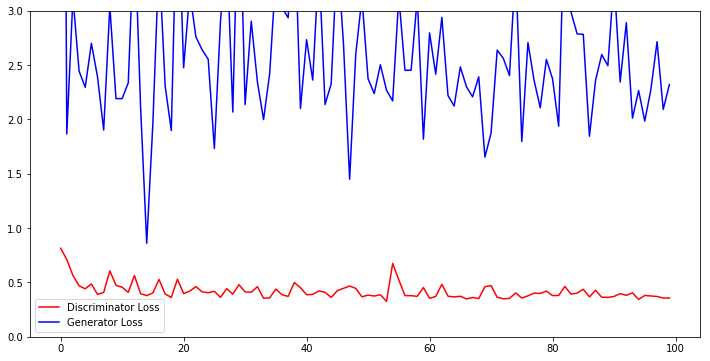

Epoch 101 of 1000
101 [D loss: 0.353591, acc.: 0.00%] [G loss: 2.849221]
Time Elapsed 8.74
Epoch 102 of 1000
102 [D loss: 0.409179, acc.: 0.00%] [G loss: 2.457091]
Time Elapsed 8.73
Epoch 103 of 1000
103 [D loss: 0.350384, acc.: 0.00%] [G loss: 1.792173]
Time Elapsed 8.77
Epoch 104 of 1000
104 [D loss: 0.370425, acc.: 0.00%] [G loss: 2.009033]
Time Elapsed 8.75
Epoch 105 of 1000
105 [D loss: 0.345703, acc.: 0.00%] [G loss: 2.010564]
Time Elapsed 8.78
Epoch 106 of 1000
106 [D loss: 0.369664, acc.: 0.00%] [G loss: 3.031864]
Time Elapsed 8.73
Epoch 107 of 1000
107 [D loss: 0.391099, acc.: 0.00%] [G loss: 2.158153]
Time Elapsed 8.76
Epoch 108 of 1000
108 [D loss: 0.388625, acc.: 0.00%] [G loss: 2.567873]
Time Elapsed 8.75
Epoch 109 of 1000
109 [D loss: 0.355604, acc.: 0.00%] [G loss: 2.117042]
Time Elapsed 8.75
Epoch 110 of 1000
110 [D loss: 0.356322, acc.: 0.00%] [G loss: 2.469106]
Time Elapsed 8.74


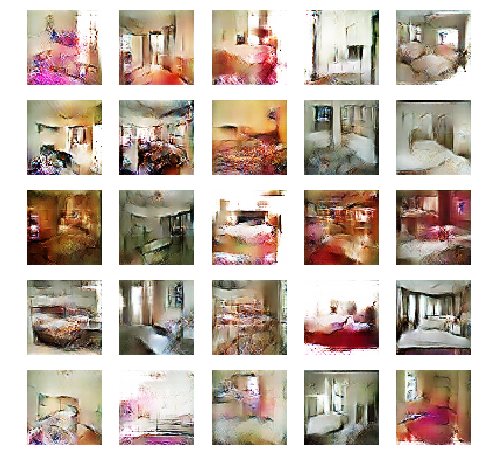

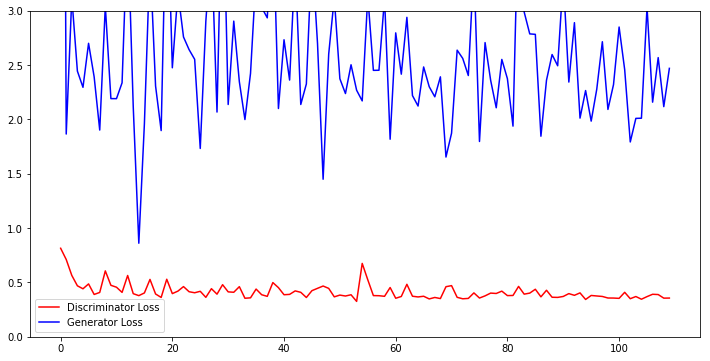

Epoch 111 of 1000
111 [D loss: 0.349197, acc.: 0.00%] [G loss: 2.004903]
Time Elapsed 8.83
Epoch 112 of 1000
112 [D loss: 0.366831, acc.: 0.00%] [G loss: 2.454449]
Time Elapsed 8.74
Epoch 113 of 1000
113 [D loss: 0.337924, acc.: 0.00%] [G loss: 2.199664]
Time Elapsed 8.71
Epoch 114 of 1000
114 [D loss: 0.365369, acc.: 0.00%] [G loss: 2.103640]
Time Elapsed 8.75
Epoch 115 of 1000
115 [D loss: 0.354225, acc.: 0.00%] [G loss: 2.229458]
Time Elapsed 8.75
Epoch 116 of 1000
116 [D loss: 0.347794, acc.: 0.00%] [G loss: 2.192157]
Time Elapsed 8.77
Epoch 117 of 1000
117 [D loss: 0.334284, acc.: 0.00%] [G loss: 2.505421]
Time Elapsed 8.79
Epoch 118 of 1000
118 [D loss: 0.354637, acc.: 0.00%] [G loss: 2.491857]
Time Elapsed 8.76
Epoch 119 of 1000
119 [D loss: 0.403659, acc.: 0.00%] [G loss: 1.690034]
Time Elapsed 8.75
Epoch 120 of 1000
120 [D loss: 0.356342, acc.: 0.00%] [G loss: 2.640890]
Time Elapsed 8.78


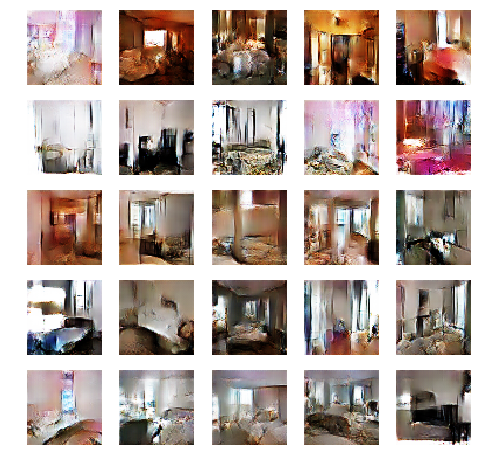

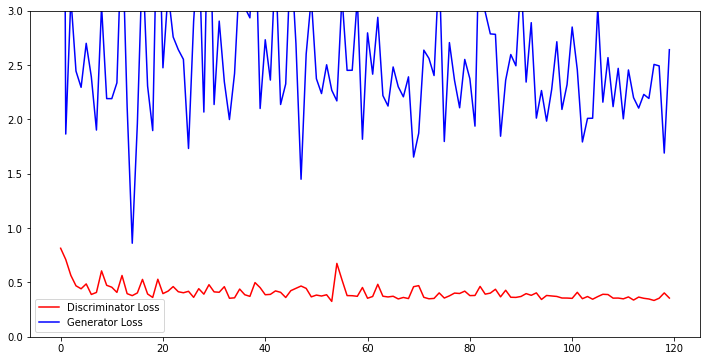

Epoch 121 of 1000
121 [D loss: 0.329655, acc.: 0.00%] [G loss: 2.186937]
Time Elapsed 8.76
Epoch 122 of 1000
122 [D loss: 0.396601, acc.: 0.00%] [G loss: 2.136070]
Time Elapsed 8.74
Epoch 123 of 1000
123 [D loss: 0.364331, acc.: 0.00%] [G loss: 2.055929]
Time Elapsed 8.77
Epoch 124 of 1000
124 [D loss: 0.346201, acc.: 0.00%] [G loss: 2.093724]
Time Elapsed 8.74
Epoch 125 of 1000
125 [D loss: 0.361653, acc.: 0.00%] [G loss: 2.314250]
Time Elapsed 8.79
Epoch 126 of 1000
126 [D loss: 0.367566, acc.: 0.00%] [G loss: 2.285180]
Time Elapsed 8.76
Epoch 127 of 1000
127 [D loss: 0.350272, acc.: 0.00%] [G loss: 1.962500]
Time Elapsed 8.76
Epoch 128 of 1000
128 [D loss: 0.392870, acc.: 0.00%] [G loss: 1.820261]
Time Elapsed 8.73
Epoch 129 of 1000
129 [D loss: 0.347415, acc.: 0.00%] [G loss: 2.481174]
Time Elapsed 8.72
Epoch 130 of 1000
130 [D loss: 0.389268, acc.: 0.00%] [G loss: 2.413039]
Time Elapsed 8.75


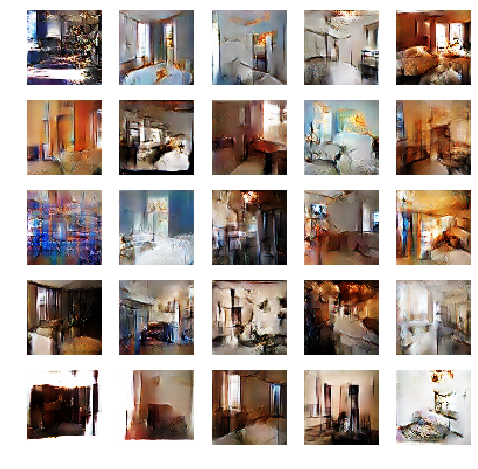

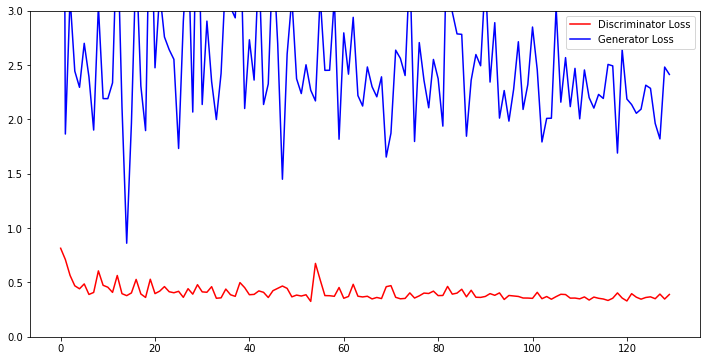

Epoch 131 of 1000
131 [D loss: 0.348468, acc.: 0.00%] [G loss: 2.087191]
Time Elapsed 8.76
Epoch 132 of 1000
132 [D loss: 0.345472, acc.: 0.00%] [G loss: 2.123482]
Time Elapsed 8.75
Epoch 133 of 1000
133 [D loss: 0.363625, acc.: 0.00%] [G loss: 1.887395]
Time Elapsed 8.76
Epoch 134 of 1000
134 [D loss: 1.424571, acc.: 0.00%] [G loss: 2.043858]
Time Elapsed 8.76
Epoch 135 of 1000
135 [D loss: 0.415797, acc.: 0.00%] [G loss: 2.058461]
Time Elapsed 8.75
Epoch 136 of 1000
136 [D loss: 0.386711, acc.: 0.00%] [G loss: 2.244942]
Time Elapsed 8.78
Epoch 137 of 1000
137 [D loss: 0.353766, acc.: 0.00%] [G loss: 2.282423]
Time Elapsed 8.74
Epoch 138 of 1000
138 [D loss: 0.349293, acc.: 0.00%] [G loss: 2.197304]
Time Elapsed 8.78
Epoch 139 of 1000
139 [D loss: 0.366704, acc.: 0.00%] [G loss: 2.025024]
Time Elapsed 8.78
Epoch 140 of 1000
140 [D loss: 0.362279, acc.: 0.00%] [G loss: 2.315995]
Time Elapsed 8.73


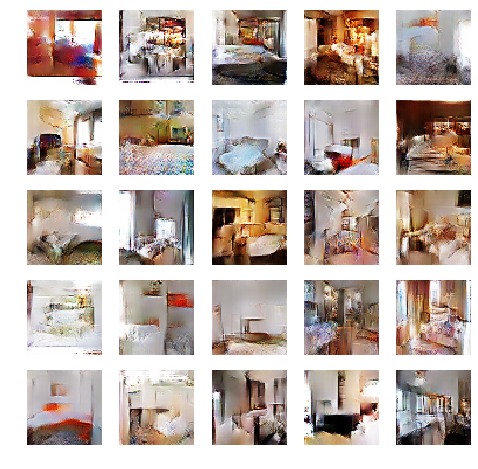

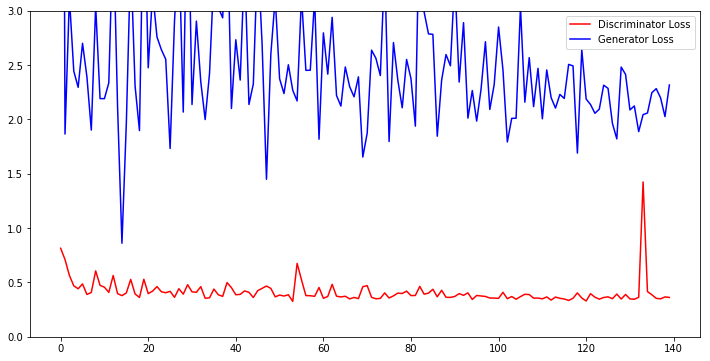

Epoch 141 of 1000
141 [D loss: 0.365698, acc.: 0.00%] [G loss: 2.230358]
Time Elapsed 8.75
Epoch 142 of 1000
142 [D loss: 0.354601, acc.: 0.00%] [G loss: 3.068309]
Time Elapsed 8.81
Epoch 143 of 1000
143 [D loss: 0.392615, acc.: 0.00%] [G loss: 2.892327]
Time Elapsed 8.79
Epoch 144 of 1000
144 [D loss: 0.366037, acc.: 0.00%] [G loss: 2.103630]
Time Elapsed 8.74
Epoch 145 of 1000
145 [D loss: 0.370054, acc.: 0.00%] [G loss: 2.483702]
Time Elapsed 8.72
Epoch 146 of 1000
146 [D loss: 2.106939, acc.: 0.00%] [G loss: 6.919092]
Time Elapsed 8.79
Epoch 147 of 1000
147 [D loss: 0.383301, acc.: 0.00%] [G loss: 2.803599]
Time Elapsed 8.75
Epoch 148 of 1000
148 [D loss: 0.373471, acc.: 0.00%] [G loss: 2.879961]
Time Elapsed 8.75
Epoch 149 of 1000
149 [D loss: 0.355024, acc.: 0.00%] [G loss: 2.462982]
Time Elapsed 8.78
Epoch 150 of 1000
150 [D loss: 0.343981, acc.: 0.00%] [G loss: 2.402503]
Time Elapsed 8.72


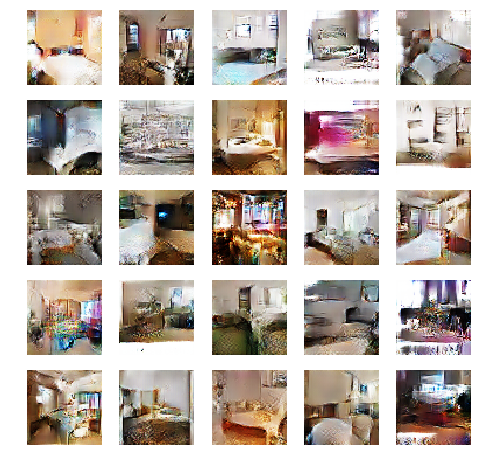

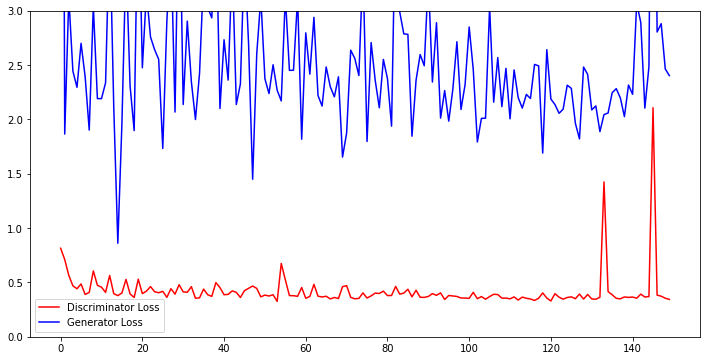

Epoch 151 of 1000
151 [D loss: 0.330465, acc.: 0.00%] [G loss: 2.432129]
Time Elapsed 8.77
Epoch 152 of 1000
152 [D loss: 0.350377, acc.: 0.00%] [G loss: 2.329149]
Time Elapsed 8.76
Epoch 153 of 1000
153 [D loss: 0.357549, acc.: 0.00%] [G loss: 2.621219]
Time Elapsed 8.77
Epoch 154 of 1000
154 [D loss: 0.355041, acc.: 0.00%] [G loss: 2.436054]
Time Elapsed 8.73
Epoch 155 of 1000
155 [D loss: 2.314318, acc.: 0.00%] [G loss: 7.155570]
Time Elapsed 8.74
Epoch 156 of 1000
156 [D loss: 0.365063, acc.: 0.00%] [G loss: 2.347552]
Time Elapsed 8.72
Epoch 157 of 1000
157 [D loss: 0.330692, acc.: 0.00%] [G loss: 2.209368]
Time Elapsed 8.73
Epoch 158 of 1000
158 [D loss: 0.326117, acc.: 0.00%] [G loss: 2.324581]
Time Elapsed 8.79
Epoch 159 of 1000
159 [D loss: 0.358228, acc.: 0.00%] [G loss: 2.044672]
Time Elapsed 8.79
Epoch 160 of 1000
160 [D loss: 0.362593, acc.: 0.00%] [G loss: 2.452325]
Time Elapsed 8.79


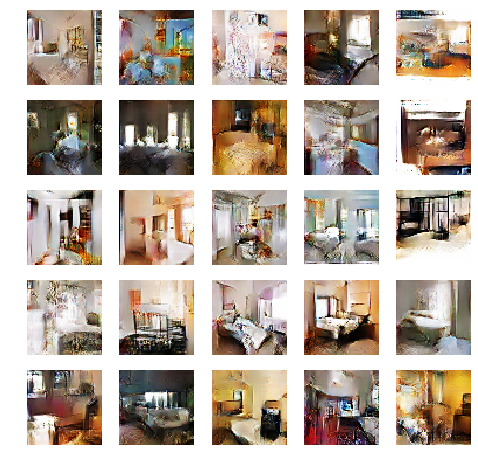

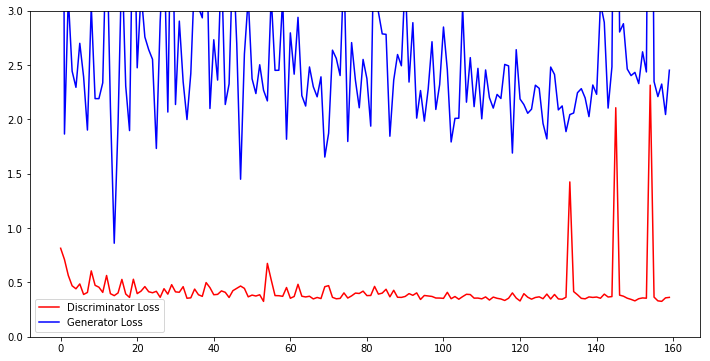

Epoch 161 of 1000
161 [D loss: 0.363852, acc.: 0.00%] [G loss: 2.410490]
Time Elapsed 8.78
Epoch 162 of 1000
162 [D loss: 0.335387, acc.: 0.00%] [G loss: 2.084046]
Time Elapsed 8.76
Epoch 163 of 1000
163 [D loss: 0.352079, acc.: 0.00%] [G loss: 2.762834]
Time Elapsed 8.77
Epoch 164 of 1000
164 [D loss: 0.375476, acc.: 0.00%] [G loss: 2.596008]
Time Elapsed 8.77
Epoch 165 of 1000
165 [D loss: 0.350545, acc.: 0.00%] [G loss: 2.208330]
Time Elapsed 8.75
Epoch 166 of 1000
166 [D loss: 0.332310, acc.: 0.00%] [G loss: 2.251649]
Time Elapsed 8.75
Epoch 167 of 1000
167 [D loss: 0.339159, acc.: 0.00%] [G loss: 2.196624]
Time Elapsed 8.81
Epoch 168 of 1000
168 [D loss: 0.372729, acc.: 0.00%] [G loss: 2.112612]
Time Elapsed 8.78
Epoch 169 of 1000
169 [D loss: 0.363614, acc.: 0.00%] [G loss: 2.392428]
Time Elapsed 8.74
Epoch 170 of 1000
170 [D loss: 0.338140, acc.: 0.00%] [G loss: 2.359099]
Time Elapsed 8.76


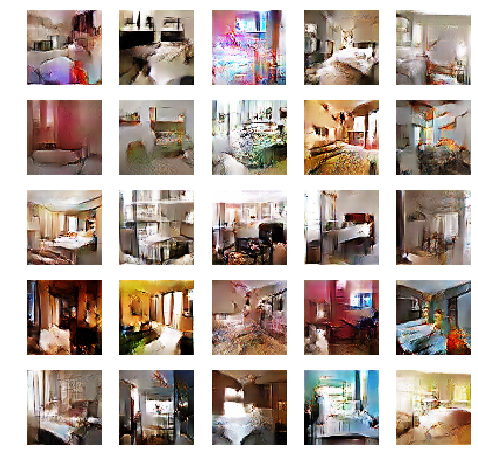

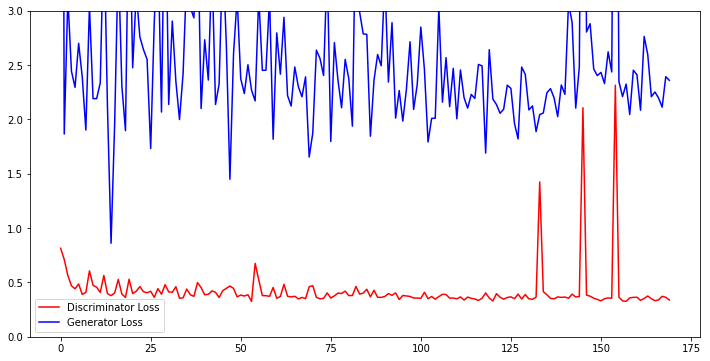

Epoch 171 of 1000
171 [D loss: 0.357438, acc.: 0.00%] [G loss: 1.910737]
Time Elapsed 8.79
Epoch 172 of 1000
172 [D loss: 0.331981, acc.: 0.00%] [G loss: 2.564413]
Time Elapsed 8.73
Epoch 173 of 1000
173 [D loss: 0.347888, acc.: 0.00%] [G loss: 2.666353]
Time Elapsed 8.73
Epoch 174 of 1000
174 [D loss: 0.343841, acc.: 0.00%] [G loss: 2.217477]
Time Elapsed 8.74
Epoch 175 of 1000
175 [D loss: 0.341609, acc.: 0.00%] [G loss: 2.456190]
Time Elapsed 8.70
Epoch 176 of 1000
176 [D loss: 0.357828, acc.: 0.00%] [G loss: 2.029170]
Time Elapsed 8.75
Epoch 177 of 1000
177 [D loss: 0.349143, acc.: 0.00%] [G loss: 2.253272]
Time Elapsed 8.70
Epoch 178 of 1000
178 [D loss: 0.365573, acc.: 0.00%] [G loss: 3.202353]
Time Elapsed 8.65
Epoch 179 of 1000
179 [D loss: 0.357856, acc.: 0.00%] [G loss: 2.972343]
Time Elapsed 8.68
Epoch 180 of 1000
180 [D loss: 0.426819, acc.: 0.00%] [G loss: 3.248873]
Time Elapsed 8.69


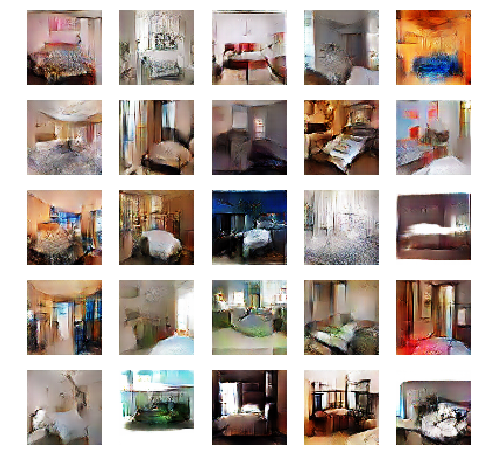

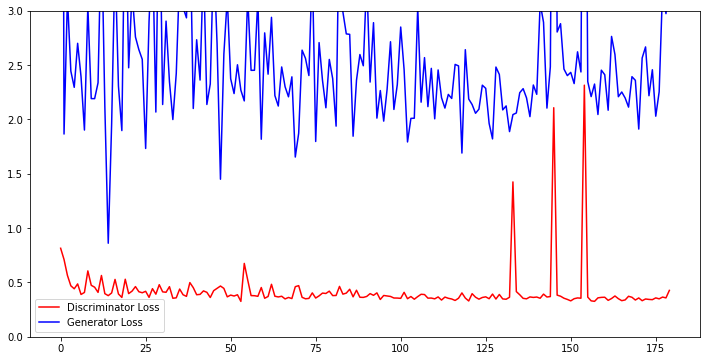

Epoch 181 of 1000
181 [D loss: 0.385004, acc.: 0.00%] [G loss: 2.047552]
Time Elapsed 8.69
Epoch 182 of 1000
182 [D loss: 0.357876, acc.: 0.00%] [G loss: 2.279860]
Time Elapsed 8.69
Epoch 183 of 1000
183 [D loss: 0.329937, acc.: 0.00%] [G loss: 2.267442]
Time Elapsed 8.70
Epoch 184 of 1000
184 [D loss: 0.372702, acc.: 0.00%] [G loss: 2.598613]
Time Elapsed 8.70
Epoch 185 of 1000
185 [D loss: 0.342978, acc.: 0.00%] [G loss: 2.028172]
Time Elapsed 8.69
Epoch 186 of 1000
186 [D loss: 0.334536, acc.: 0.00%] [G loss: 2.241932]
Time Elapsed 8.69
Epoch 187 of 1000
187 [D loss: 0.348991, acc.: 0.00%] [G loss: 2.273512]
Time Elapsed 8.71
Epoch 188 of 1000
188 [D loss: 0.421530, acc.: 0.00%] [G loss: 1.902666]
Time Elapsed 8.74
Epoch 189 of 1000
189 [D loss: 0.381594, acc.: 0.00%] [G loss: 2.564264]
Time Elapsed 8.71
Epoch 190 of 1000
190 [D loss: 0.339426, acc.: 0.00%] [G loss: 1.939167]
Time Elapsed 8.72


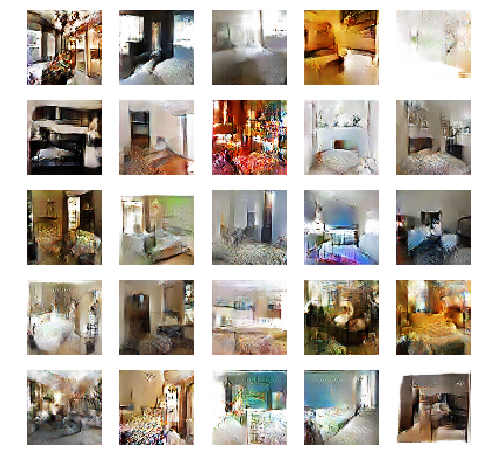

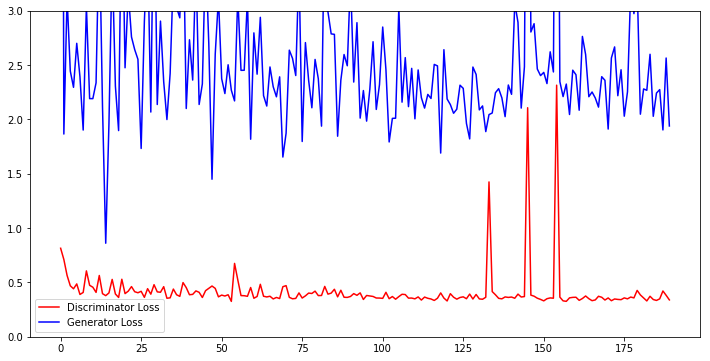

Epoch 191 of 1000
191 [D loss: 0.344079, acc.: 0.00%] [G loss: 2.394714]
Time Elapsed 8.85
Epoch 192 of 1000
192 [D loss: 0.334366, acc.: 0.00%] [G loss: 2.157058]
Time Elapsed 8.74
Epoch 193 of 1000
193 [D loss: 0.354113, acc.: 0.00%] [G loss: 2.238861]
Time Elapsed 8.69
Epoch 194 of 1000
194 [D loss: 0.337643, acc.: 0.00%] [G loss: 2.093148]
Time Elapsed 8.68
Epoch 195 of 1000
195 [D loss: 0.343892, acc.: 0.00%] [G loss: 2.285996]
Time Elapsed 8.70
Epoch 196 of 1000
196 [D loss: 0.350891, acc.: 0.00%] [G loss: 2.710332]
Time Elapsed 8.70
Epoch 197 of 1000
197 [D loss: 0.351972, acc.: 0.00%] [G loss: 2.618193]
Time Elapsed 8.79
Epoch 198 of 1000
198 [D loss: 0.354854, acc.: 0.00%] [G loss: 1.951736]
Time Elapsed 8.78
Epoch 199 of 1000
199 [D loss: 0.342080, acc.: 0.00%] [G loss: 1.988352]
Time Elapsed 8.76
Epoch 200 of 1000
200 [D loss: 0.329921, acc.: 0.00%] [G loss: 2.671688]
Time Elapsed 8.67


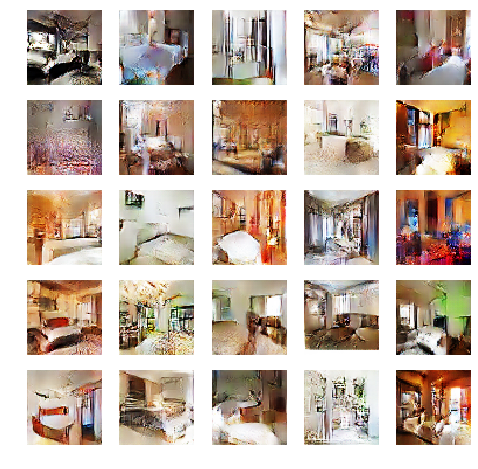

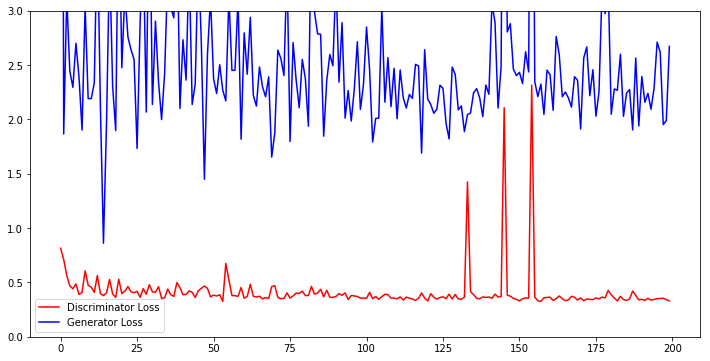

Epoch 201 of 1000
201 [D loss: 0.350468, acc.: 0.00%] [G loss: 2.285477]
Time Elapsed 8.76
Epoch 202 of 1000
202 [D loss: 0.333520, acc.: 0.00%] [G loss: 2.280643]
Time Elapsed 8.82
Epoch 203 of 1000
203 [D loss: 0.365143, acc.: 0.00%] [G loss: 1.982301]
Time Elapsed 8.78
Epoch 204 of 1000
204 [D loss: 0.349928, acc.: 0.00%] [G loss: 2.461059]
Time Elapsed 8.88
Epoch 205 of 1000
205 [D loss: 0.352362, acc.: 0.00%] [G loss: 2.545192]
Time Elapsed 8.68
Epoch 206 of 1000
206 [D loss: 0.346889, acc.: 0.00%] [G loss: 2.453690]
Time Elapsed 8.72
Epoch 207 of 1000
207 [D loss: 0.344513, acc.: 0.00%] [G loss: 2.719969]
Time Elapsed 8.67
Epoch 208 of 1000
208 [D loss: 0.352009, acc.: 0.00%] [G loss: 2.679359]
Time Elapsed 8.68
Epoch 209 of 1000
209 [D loss: 0.355351, acc.: 0.00%] [G loss: 2.157250]
Time Elapsed 8.67
Epoch 210 of 1000
210 [D loss: 0.368649, acc.: 0.00%] [G loss: 1.957865]
Time Elapsed 8.66


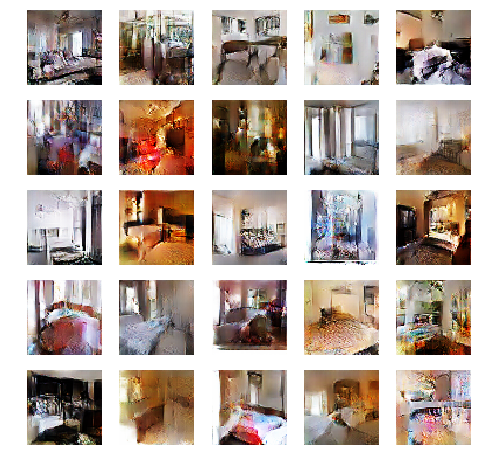

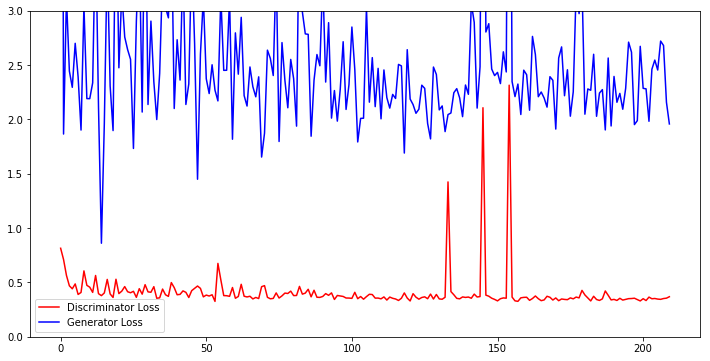

Epoch 211 of 1000
211 [D loss: 0.339943, acc.: 0.00%] [G loss: 2.416546]
Time Elapsed 8.71
Epoch 212 of 1000
212 [D loss: 0.384105, acc.: 0.00%] [G loss: 2.132905]
Time Elapsed 8.68
Epoch 213 of 1000
213 [D loss: 0.345620, acc.: 0.00%] [G loss: 1.839059]
Time Elapsed 8.69
Epoch 214 of 1000
214 [D loss: 0.337447, acc.: 0.00%] [G loss: 2.265034]
Time Elapsed 8.67
Epoch 215 of 1000
215 [D loss: 0.341480, acc.: 0.00%] [G loss: 2.333727]
Time Elapsed 8.68
Epoch 216 of 1000
216 [D loss: 0.341739, acc.: 0.00%] [G loss: 2.017919]
Time Elapsed 8.65
Epoch 217 of 1000
217 [D loss: 0.320246, acc.: 0.00%] [G loss: 2.236009]
Time Elapsed 8.66
Epoch 218 of 1000
218 [D loss: 0.357122, acc.: 0.00%] [G loss: 2.205445]
Time Elapsed 8.68
Epoch 219 of 1000
219 [D loss: 0.325472, acc.: 0.00%] [G loss: 2.483227]
Time Elapsed 8.67
Epoch 220 of 1000
220 [D loss: 0.349756, acc.: 0.00%] [G loss: 2.490148]
Time Elapsed 8.66


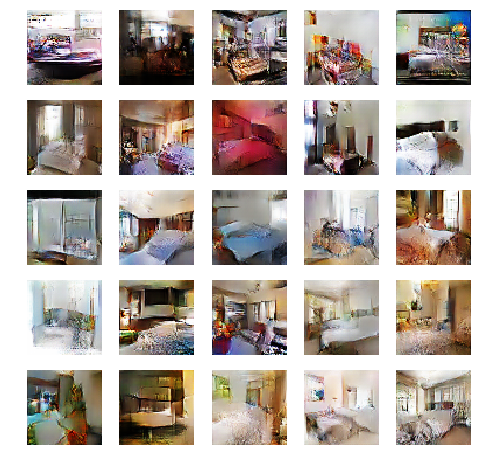

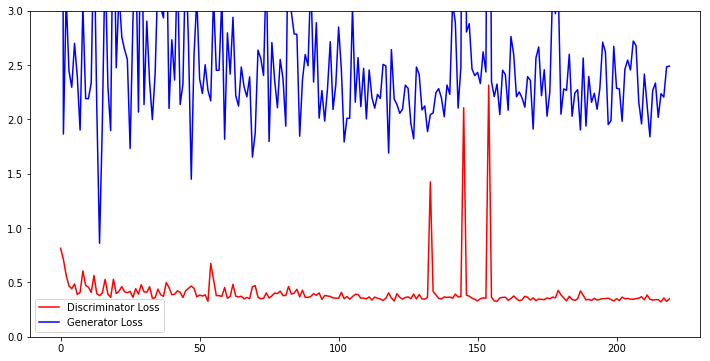

Epoch 221 of 1000
221 [D loss: 0.357205, acc.: 0.00%] [G loss: 1.903996]
Time Elapsed 9.14
Epoch 222 of 1000
222 [D loss: 0.327195, acc.: 0.00%] [G loss: 2.382581]
Time Elapsed 8.69
Epoch 223 of 1000
223 [D loss: 0.333271, acc.: 0.00%] [G loss: 2.316735]
Time Elapsed 8.67
Epoch 224 of 1000
224 [D loss: 0.342231, acc.: 0.00%] [G loss: 2.571079]
Time Elapsed 8.71
Epoch 225 of 1000
225 [D loss: 0.337078, acc.: 0.00%] [G loss: 2.743304]
Time Elapsed 8.67
Epoch 226 of 1000
226 [D loss: 0.348378, acc.: 0.00%] [G loss: 2.447983]
Time Elapsed 8.69
Epoch 227 of 1000
227 [D loss: 0.356506, acc.: 0.00%] [G loss: 1.883479]
Time Elapsed 8.68
Epoch 228 of 1000
228 [D loss: 0.348478, acc.: 0.00%] [G loss: 2.501720]
Time Elapsed 8.66
Epoch 229 of 1000
229 [D loss: 0.354833, acc.: 0.00%] [G loss: 2.560189]
Time Elapsed 8.68
Epoch 230 of 1000
230 [D loss: 0.347374, acc.: 0.00%] [G loss: 2.188356]
Time Elapsed 8.68


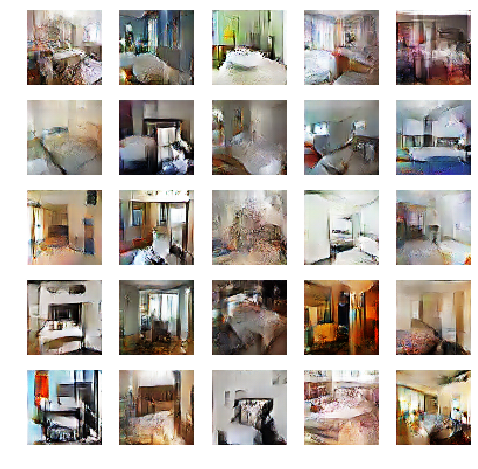

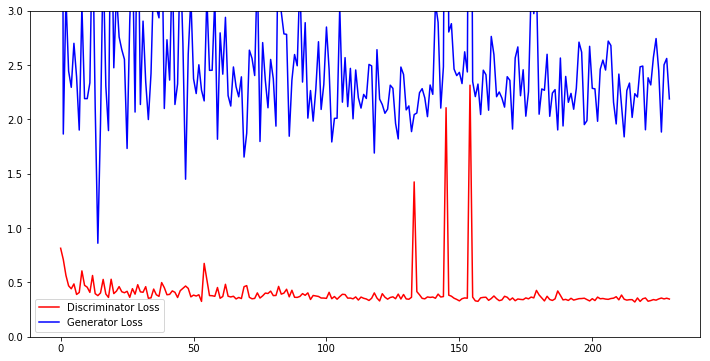

Epoch 231 of 1000
231 [D loss: 0.353596, acc.: 0.00%] [G loss: 1.936619]
Time Elapsed 8.68
Epoch 232 of 1000
232 [D loss: 0.400279, acc.: 0.00%] [G loss: 2.716725]
Time Elapsed 8.67
Epoch 233 of 1000
233 [D loss: 0.344272, acc.: 0.00%] [G loss: 2.217515]
Time Elapsed 8.67
Epoch 234 of 1000
234 [D loss: 0.324864, acc.: 0.00%] [G loss: 2.228312]
Time Elapsed 8.69
Epoch 235 of 1000
235 [D loss: 0.345674, acc.: 0.00%] [G loss: 2.016551]
Time Elapsed 8.67
Epoch 236 of 1000
236 [D loss: 0.328553, acc.: 0.00%] [G loss: 2.126061]
Time Elapsed 8.65
Epoch 237 of 1000
237 [D loss: 0.338974, acc.: 0.00%] [G loss: 2.104355]
Time Elapsed 8.67
Epoch 238 of 1000
238 [D loss: 0.354418, acc.: 0.00%] [G loss: 1.966203]
Time Elapsed 8.72
Epoch 239 of 1000
239 [D loss: 0.376809, acc.: 0.00%] [G loss: 2.024034]
Time Elapsed 8.68
Epoch 240 of 1000
240 [D loss: 0.356477, acc.: 0.00%] [G loss: 1.969931]
Time Elapsed 8.70


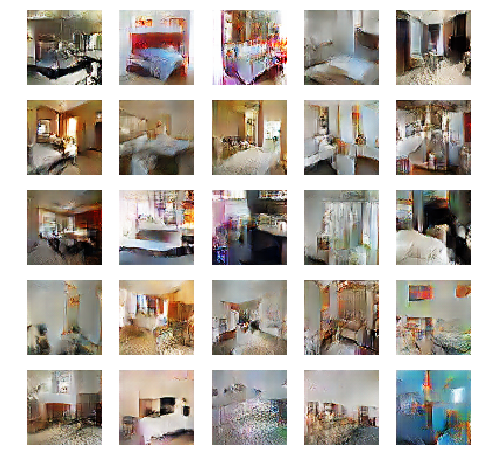

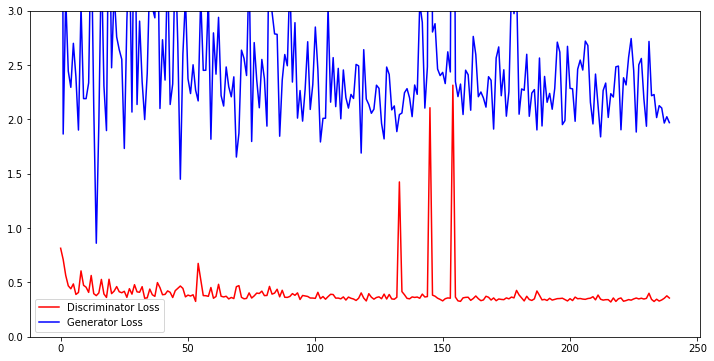

Epoch 241 of 1000
241 [D loss: 0.341856, acc.: 0.00%] [G loss: 2.396902]
Time Elapsed 8.68
Epoch 242 of 1000
242 [D loss: 0.335432, acc.: 0.00%] [G loss: 2.341523]
Time Elapsed 8.67
Epoch 243 of 1000
243 [D loss: 0.357356, acc.: 0.00%] [G loss: 2.383600]
Time Elapsed 8.71
Epoch 244 of 1000
244 [D loss: 0.339410, acc.: 0.00%] [G loss: 2.320834]
Time Elapsed 8.71
Epoch 245 of 1000
245 [D loss: 0.358210, acc.: 0.00%] [G loss: 2.343837]
Time Elapsed 8.71
Epoch 246 of 1000
246 [D loss: 0.329822, acc.: 0.00%] [G loss: 2.248721]
Time Elapsed 8.71
Epoch 247 of 1000
247 [D loss: 0.352522, acc.: 0.00%] [G loss: 2.092865]
Time Elapsed 8.70
Epoch 248 of 1000
248 [D loss: 0.329323, acc.: 0.00%] [G loss: 2.493299]
Time Elapsed 8.69
Epoch 249 of 1000
249 [D loss: 0.359099, acc.: 0.00%] [G loss: 2.166421]
Time Elapsed 8.66
Epoch 250 of 1000
250 [D loss: 0.350584, acc.: 0.00%] [G loss: 2.219202]
Time Elapsed 8.67


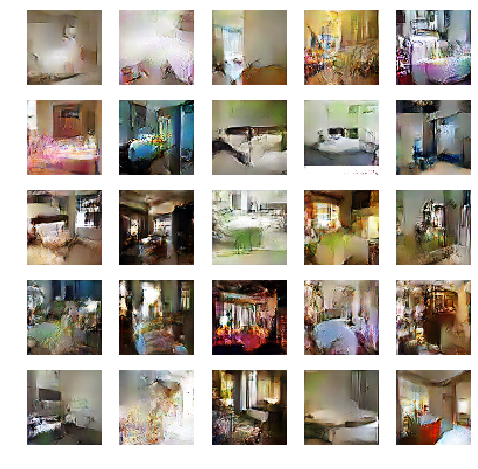

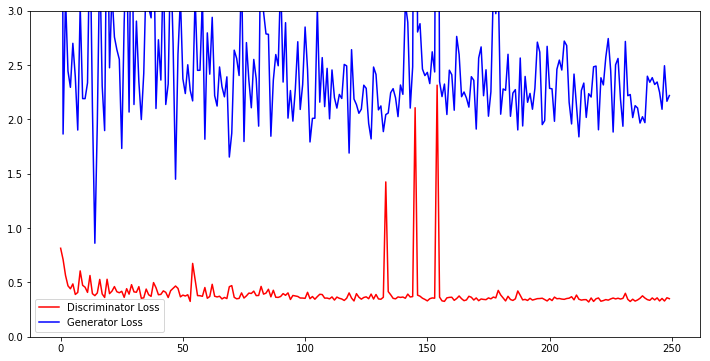

Epoch 251 of 1000
251 [D loss: 0.345606, acc.: 0.00%] [G loss: 1.986693]
Time Elapsed 8.68
Epoch 252 of 1000
252 [D loss: 0.372211, acc.: 0.00%] [G loss: 2.010298]
Time Elapsed 8.65
Epoch 253 of 1000
253 [D loss: 0.340719, acc.: 0.00%] [G loss: 2.229365]
Time Elapsed 8.71
Epoch 254 of 1000
254 [D loss: 0.386167, acc.: 0.00%] [G loss: 2.497981]
Time Elapsed 8.68
Epoch 255 of 1000
255 [D loss: 0.331754, acc.: 0.00%] [G loss: 2.239646]
Time Elapsed 8.70
Epoch 256 of 1000
256 [D loss: 0.341677, acc.: 0.00%] [G loss: 1.845931]
Time Elapsed 8.66
Epoch 257 of 1000
257 [D loss: 0.358738, acc.: 0.00%] [G loss: 2.053498]
Time Elapsed 8.67
Epoch 258 of 1000
258 [D loss: 0.348553, acc.: 0.00%] [G loss: 2.017375]
Time Elapsed 8.67
Epoch 259 of 1000
259 [D loss: 0.350166, acc.: 0.00%] [G loss: 2.347234]
Time Elapsed 8.65
Epoch 260 of 1000
260 [D loss: 0.347161, acc.: 0.00%] [G loss: 2.125895]
Time Elapsed 8.65


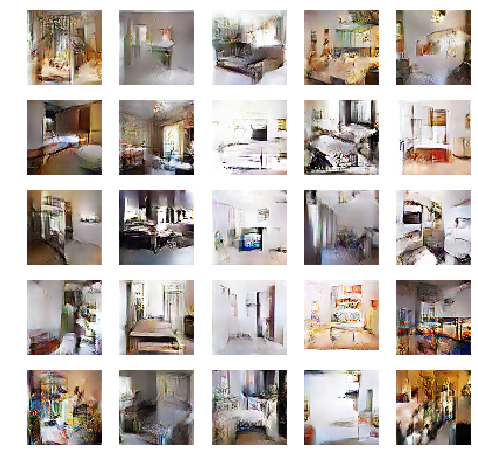

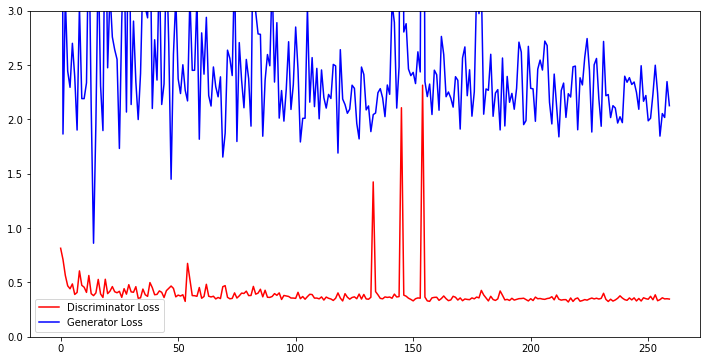

Epoch 261 of 1000
261 [D loss: 0.366147, acc.: 0.00%] [G loss: 2.400465]
Time Elapsed 8.66
Epoch 262 of 1000
262 [D loss: 0.359742, acc.: 0.00%] [G loss: 1.599498]
Time Elapsed 8.64
Epoch 263 of 1000
263 [D loss: 1.120350, acc.: 0.00%] [G loss: 2.052384]
Time Elapsed 8.61
Epoch 264 of 1000
264 [D loss: 0.326919, acc.: 0.00%] [G loss: 2.382050]
Time Elapsed 8.63
Epoch 265 of 1000
265 [D loss: 0.330403, acc.: 0.00%] [G loss: 1.867701]
Time Elapsed 8.62
Epoch 266 of 1000
266 [D loss: 0.335468, acc.: 0.00%] [G loss: 2.134936]
Time Elapsed 8.62
Epoch 267 of 1000
267 [D loss: 0.323407, acc.: 0.00%] [G loss: 2.021589]
Time Elapsed 8.65
Epoch 268 of 1000
268 [D loss: 0.349144, acc.: 0.00%] [G loss: 2.153226]
Time Elapsed 8.63
Epoch 269 of 1000
269 [D loss: 0.321132, acc.: 0.00%] [G loss: 2.115877]
Time Elapsed 8.62
Epoch 270 of 1000
270 [D loss: 0.341037, acc.: 0.00%] [G loss: 2.056467]
Time Elapsed 8.67


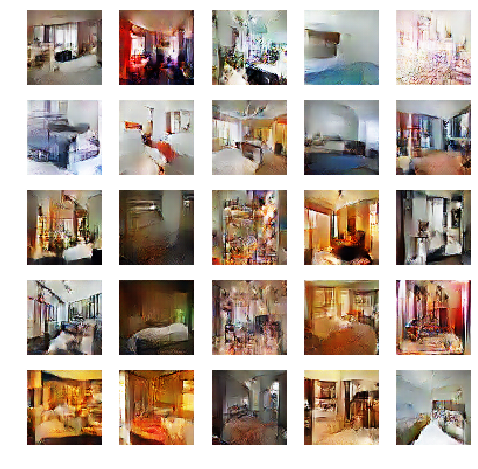

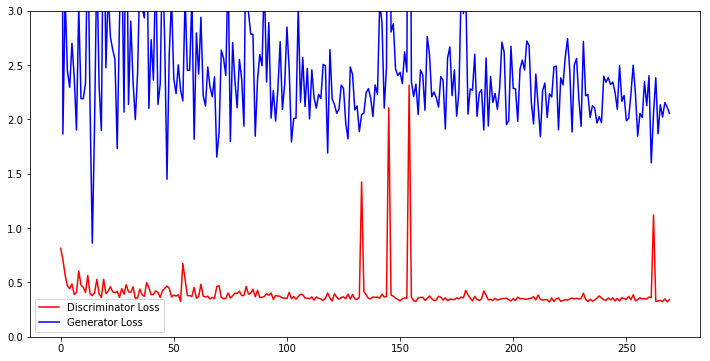

Epoch 271 of 1000
271 [D loss: 0.321548, acc.: 0.00%] [G loss: 2.079372]
Time Elapsed 8.67
Epoch 272 of 1000
272 [D loss: 0.314979, acc.: 0.00%] [G loss: 2.121969]
Time Elapsed 8.61
Epoch 273 of 1000
273 [D loss: 0.326457, acc.: 0.00%] [G loss: 2.195403]
Time Elapsed 8.64
Epoch 274 of 1000
274 [D loss: 0.333257, acc.: 0.00%] [G loss: 2.132062]
Time Elapsed 8.62
Epoch 275 of 1000
275 [D loss: 0.336143, acc.: 0.00%] [G loss: 1.968993]
Time Elapsed 8.66
Epoch 276 of 1000
276 [D loss: 0.348898, acc.: 0.00%] [G loss: 2.196714]
Time Elapsed 8.64
Epoch 277 of 1000
277 [D loss: 0.320254, acc.: 0.00%] [G loss: 2.122041]
Time Elapsed 8.65
Epoch 278 of 1000
278 [D loss: 0.329061, acc.: 0.00%] [G loss: 2.046371]
Time Elapsed 8.65
Epoch 279 of 1000
279 [D loss: 0.359786, acc.: 0.00%] [G loss: 2.292330]
Time Elapsed 8.65
Epoch 280 of 1000
280 [D loss: 0.324546, acc.: 0.00%] [G loss: 2.452617]
Time Elapsed 8.63


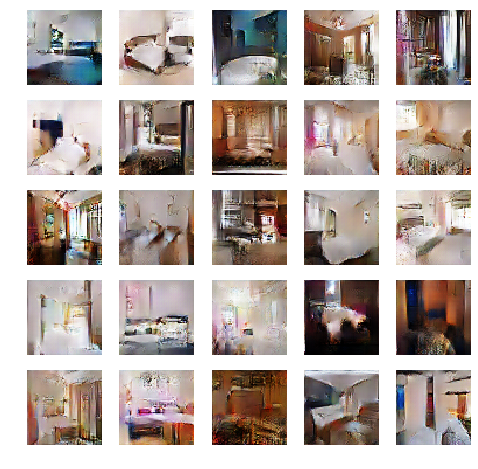

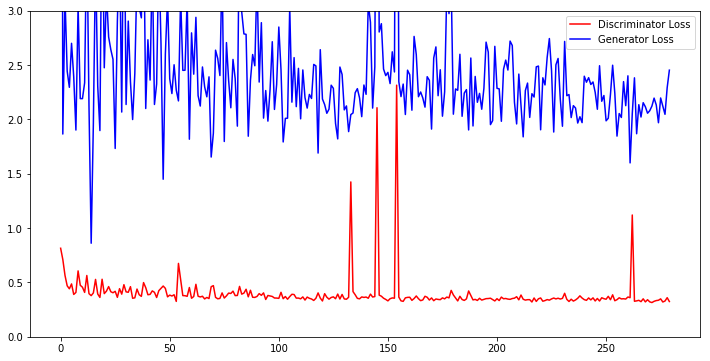

Epoch 281 of 1000
281 [D loss: 0.347513, acc.: 0.00%] [G loss: 2.237502]
Time Elapsed 8.65
Epoch 282 of 1000
282 [D loss: 0.330847, acc.: 0.00%] [G loss: 2.371256]
Time Elapsed 8.62
Epoch 283 of 1000
283 [D loss: 0.335662, acc.: 0.00%] [G loss: 1.995060]
Time Elapsed 8.65
Epoch 284 of 1000
284 [D loss: 0.352282, acc.: 0.00%] [G loss: 2.218342]
Time Elapsed 8.63
Epoch 285 of 1000
285 [D loss: 0.343804, acc.: 0.00%] [G loss: 2.182761]
Time Elapsed 8.64
Epoch 286 of 1000
286 [D loss: 0.335965, acc.: 0.00%] [G loss: 2.358462]
Time Elapsed 8.66
Epoch 287 of 1000
287 [D loss: 0.329749, acc.: 0.00%] [G loss: 2.143342]
Time Elapsed 8.64
Epoch 288 of 1000
288 [D loss: 0.341865, acc.: 0.00%] [G loss: 2.299613]
Time Elapsed 8.63
Epoch 289 of 1000
289 [D loss: 0.348214, acc.: 0.00%] [G loss: 2.719016]
Time Elapsed 8.64
Epoch 290 of 1000
290 [D loss: 0.351744, acc.: 0.00%] [G loss: 2.011062]
Time Elapsed 8.65


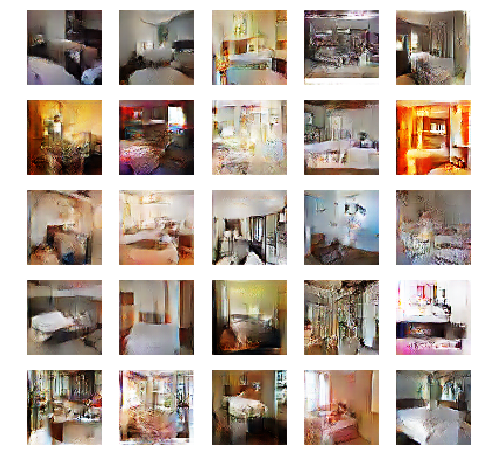

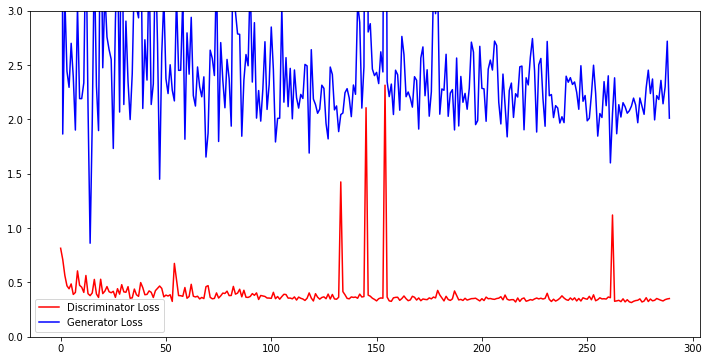

Epoch 291 of 1000
291 [D loss: 0.341813, acc.: 0.00%] [G loss: 2.493174]
Time Elapsed 8.67
Epoch 292 of 1000
292 [D loss: 0.351542, acc.: 0.00%] [G loss: 2.204192]
Time Elapsed 8.66
Epoch 293 of 1000
293 [D loss: 0.355950, acc.: 0.00%] [G loss: 2.254632]
Time Elapsed 8.64
Epoch 294 of 1000
294 [D loss: 0.341665, acc.: 0.00%] [G loss: 2.408992]
Time Elapsed 8.66
Epoch 295 of 1000
295 [D loss: 0.332529, acc.: 0.00%] [G loss: 2.163678]
Time Elapsed 8.66
Epoch 296 of 1000
296 [D loss: 0.383310, acc.: 0.00%] [G loss: 2.013406]
Time Elapsed 8.68
Epoch 297 of 1000
297 [D loss: 0.319902, acc.: 0.00%] [G loss: 1.982457]
Time Elapsed 8.66
Epoch 298 of 1000
298 [D loss: 0.348980, acc.: 0.00%] [G loss: 2.004571]
Time Elapsed 8.65
Epoch 299 of 1000
299 [D loss: 0.330079, acc.: 0.00%] [G loss: 2.280781]
Time Elapsed 8.64
Epoch 300 of 1000
300 [D loss: 0.345015, acc.: 0.00%] [G loss: 2.126737]
Time Elapsed 8.67


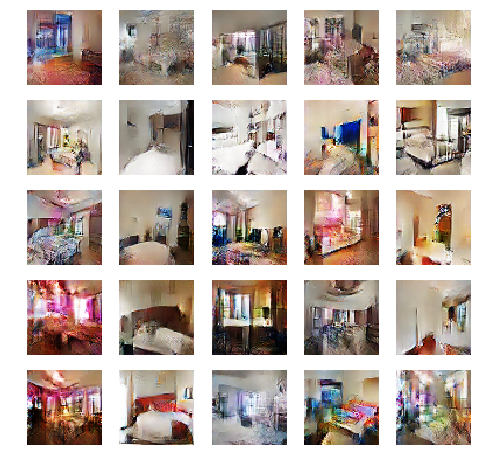

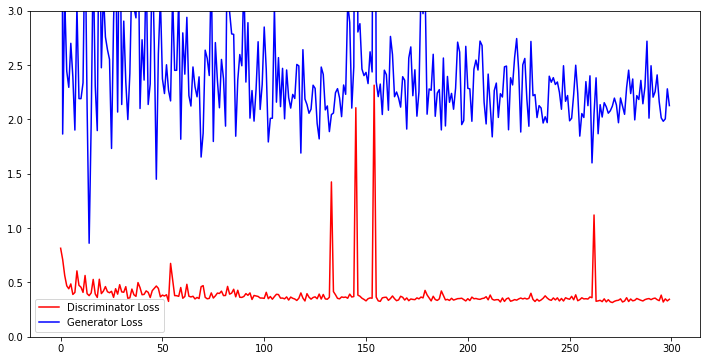

Epoch 301 of 1000
301 [D loss: 0.330620, acc.: 0.00%] [G loss: 2.312815]
Time Elapsed 8.63
Epoch 302 of 1000
302 [D loss: 0.339283, acc.: 0.00%] [G loss: 2.107877]
Time Elapsed 8.69
Epoch 303 of 1000
303 [D loss: 0.322640, acc.: 0.00%] [G loss: 2.405104]
Time Elapsed 8.65
Epoch 304 of 1000
304 [D loss: 0.331445, acc.: 0.00%] [G loss: 2.252403]
Time Elapsed 8.65
Epoch 305 of 1000
305 [D loss: 0.336854, acc.: 0.00%] [G loss: 2.162124]
Time Elapsed 8.65
Epoch 306 of 1000
306 [D loss: 0.369501, acc.: 0.00%] [G loss: 2.157743]
Time Elapsed 8.64
Epoch 307 of 1000
307 [D loss: 0.311854, acc.: 0.00%] [G loss: 2.104624]
Time Elapsed 8.65
Epoch 308 of 1000
308 [D loss: 0.333799, acc.: 0.00%] [G loss: 2.063309]
Time Elapsed 8.66
Epoch 309 of 1000
309 [D loss: 0.333846, acc.: 0.00%] [G loss: 2.221765]
Time Elapsed 8.67
Epoch 310 of 1000
310 [D loss: 0.346672, acc.: 0.00%] [G loss: 2.240149]
Time Elapsed 8.66


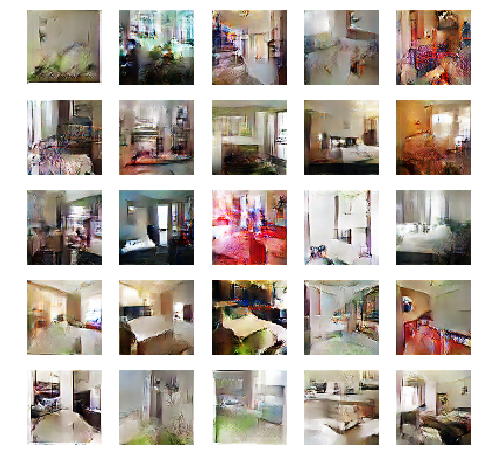

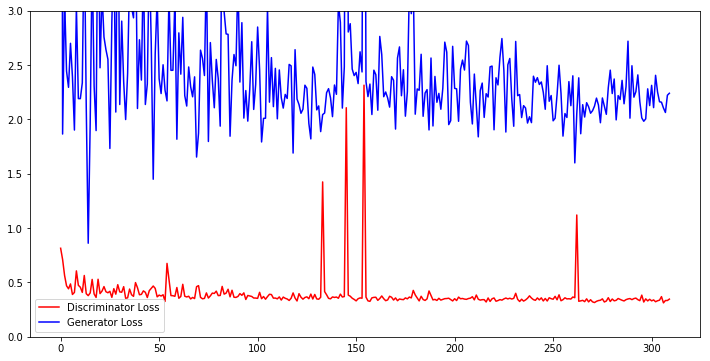

Epoch 311 of 1000
311 [D loss: 0.336593, acc.: 0.00%] [G loss: 2.309028]
Time Elapsed 8.64
Epoch 312 of 1000
312 [D loss: 0.325606, acc.: 0.00%] [G loss: 2.453569]
Time Elapsed 8.62
Epoch 313 of 1000
313 [D loss: 0.349502, acc.: 0.00%] [G loss: 2.109796]
Time Elapsed 8.65
Epoch 314 of 1000
314 [D loss: 0.340206, acc.: 0.00%] [G loss: 2.286503]
Time Elapsed 8.64
Epoch 315 of 1000
315 [D loss: 0.353534, acc.: 0.00%] [G loss: 2.160292]
Time Elapsed 8.64
Epoch 316 of 1000
316 [D loss: 0.353088, acc.: 0.00%] [G loss: 1.953296]
Time Elapsed 8.66
Epoch 317 of 1000
317 [D loss: 0.343769, acc.: 0.00%] [G loss: 2.105142]
Time Elapsed 8.64
Epoch 318 of 1000
318 [D loss: 0.335366, acc.: 0.00%] [G loss: 1.960933]
Time Elapsed 8.68
Epoch 319 of 1000
319 [D loss: 0.349346, acc.: 0.00%] [G loss: 2.285734]
Time Elapsed 8.66
Epoch 320 of 1000
320 [D loss: 0.338607, acc.: 0.00%] [G loss: 2.329831]
Time Elapsed 8.65


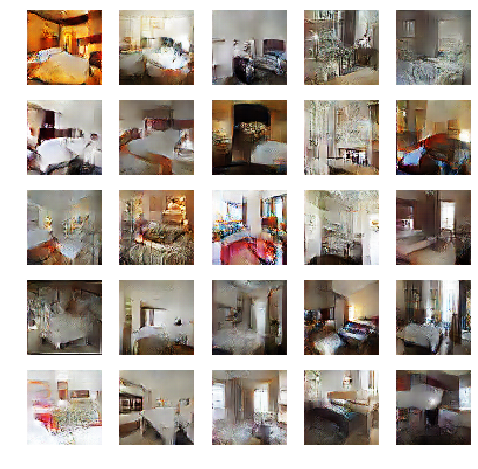

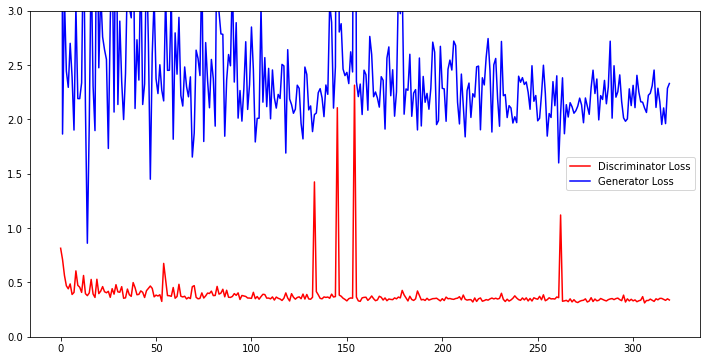

Epoch 321 of 1000
321 [D loss: 0.337622, acc.: 0.00%] [G loss: 1.963380]
Time Elapsed 8.66
Epoch 322 of 1000
322 [D loss: 0.341676, acc.: 0.00%] [G loss: 2.566777]
Time Elapsed 8.66
Epoch 323 of 1000
323 [D loss: 0.331690, acc.: 0.00%] [G loss: 2.022019]
Time Elapsed 8.67
Epoch 324 of 1000
324 [D loss: 0.338681, acc.: 0.00%] [G loss: 2.416497]
Time Elapsed 8.68
Epoch 325 of 1000
325 [D loss: 0.333678, acc.: 0.00%] [G loss: 2.344516]
Time Elapsed 8.62
Epoch 326 of 1000
326 [D loss: 0.361417, acc.: 0.00%] [G loss: 2.035932]
Time Elapsed 8.67
Epoch 327 of 1000
327 [D loss: 0.338482, acc.: 0.00%] [G loss: 2.092096]
Time Elapsed 8.65
Epoch 328 of 1000
328 [D loss: 0.351706, acc.: 0.00%] [G loss: 2.177585]
Time Elapsed 8.68
Epoch 329 of 1000
329 [D loss: 0.332672, acc.: 0.00%] [G loss: 2.205485]
Time Elapsed 8.66
Epoch 330 of 1000
330 [D loss: 0.339775, acc.: 0.00%] [G loss: 2.280612]
Time Elapsed 8.66


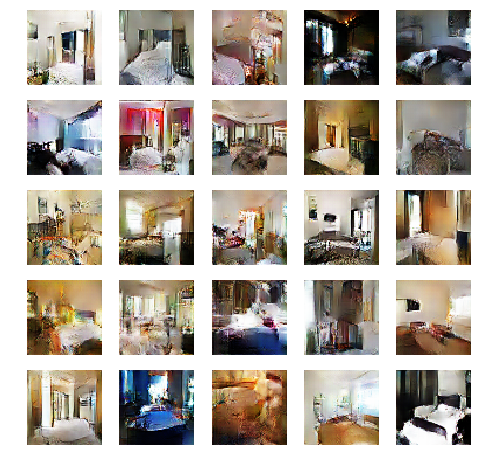

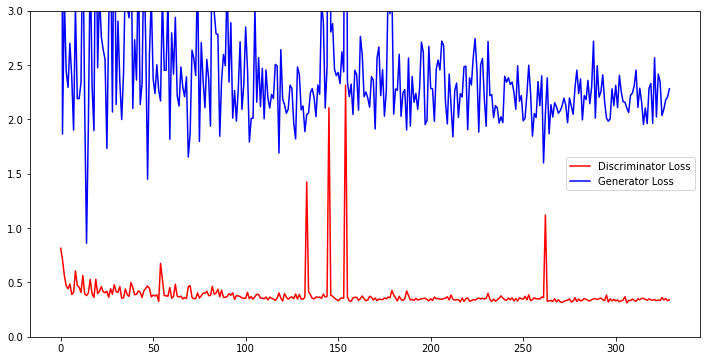

Epoch 331 of 1000
331 [D loss: 0.328010, acc.: 0.00%] [G loss: 2.224486]
Time Elapsed 8.69
Epoch 332 of 1000
332 [D loss: 0.349019, acc.: 0.00%] [G loss: 2.187667]
Time Elapsed 8.65
Epoch 333 of 1000
333 [D loss: 0.336424, acc.: 0.00%] [G loss: 2.298902]
Time Elapsed 8.65
Epoch 334 of 1000
334 [D loss: 0.367879, acc.: 0.00%] [G loss: 2.197215]
Time Elapsed 8.70
Epoch 335 of 1000
335 [D loss: 0.342460, acc.: 0.00%] [G loss: 2.255921]
Time Elapsed 8.66
Epoch 336 of 1000
336 [D loss: 0.330045, acc.: 0.00%] [G loss: 2.395216]
Time Elapsed 8.68
Epoch 337 of 1000
337 [D loss: 0.325765, acc.: 0.00%] [G loss: 2.061028]
Time Elapsed 8.67
Epoch 338 of 1000
338 [D loss: 0.351030, acc.: 0.00%] [G loss: 2.361387]
Time Elapsed 8.66
Epoch 339 of 1000
339 [D loss: 0.332612, acc.: 0.00%] [G loss: 2.289026]
Time Elapsed 8.62
Epoch 340 of 1000
340 [D loss: 0.409449, acc.: 0.00%] [G loss: 2.442216]
Time Elapsed 8.64


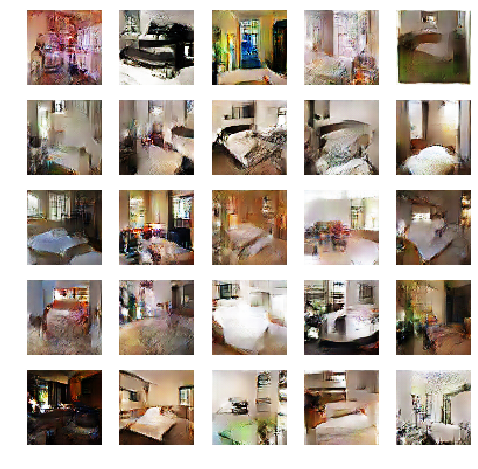

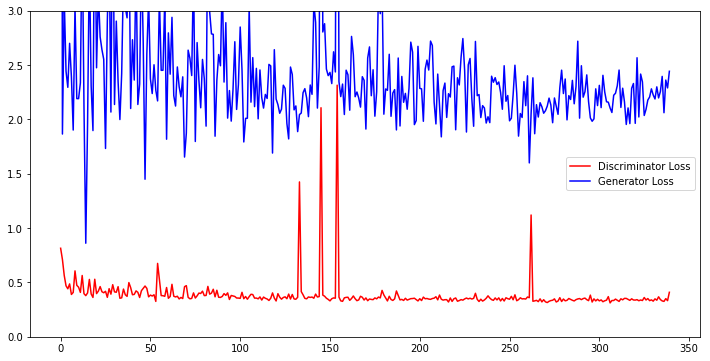

Epoch 341 of 1000
341 [D loss: 0.342623, acc.: 0.00%] [G loss: 2.147883]
Time Elapsed 8.65
Epoch 342 of 1000
342 [D loss: 0.320715, acc.: 0.00%] [G loss: 2.230443]
Time Elapsed 8.61
Epoch 343 of 1000
343 [D loss: 0.335756, acc.: 0.00%] [G loss: 2.159457]
Time Elapsed 8.67
Epoch 344 of 1000
344 [D loss: 0.337874, acc.: 0.00%] [G loss: 2.295327]
Time Elapsed 8.68
Epoch 345 of 1000
345 [D loss: 0.341495, acc.: 0.00%] [G loss: 2.597584]
Time Elapsed 8.66
Epoch 346 of 1000
346 [D loss: 0.350892, acc.: 0.00%] [G loss: 1.885583]
Time Elapsed 8.65
Epoch 347 of 1000
347 [D loss: 0.353787, acc.: 0.00%] [G loss: 2.293196]
Time Elapsed 8.66
Epoch 348 of 1000
348 [D loss: 0.335505, acc.: 0.00%] [G loss: 2.451425]
Time Elapsed 8.66
Epoch 349 of 1000
349 [D loss: 0.356280, acc.: 0.00%] [G loss: 1.922347]
Time Elapsed 8.67
Epoch 350 of 1000
350 [D loss: 0.340845, acc.: 0.00%] [G loss: 1.892486]
Time Elapsed 8.67


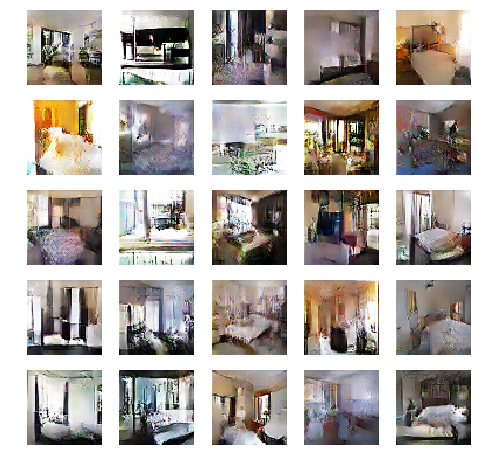

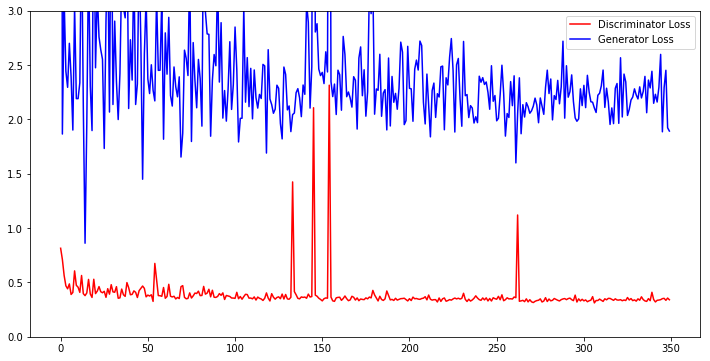

Epoch 351 of 1000
351 [D loss: 0.357804, acc.: 0.00%] [G loss: 2.184342]
Time Elapsed 8.67
Epoch 352 of 1000
352 [D loss: 0.325754, acc.: 0.00%] [G loss: 2.149443]
Time Elapsed 8.67
Epoch 353 of 1000
353 [D loss: 0.333542, acc.: 0.00%] [G loss: 1.915879]
Time Elapsed 8.68
Epoch 354 of 1000
354 [D loss: 0.341549, acc.: 0.00%] [G loss: 2.194933]
Time Elapsed 8.64
Epoch 355 of 1000
355 [D loss: 0.331405, acc.: 0.00%] [G loss: 2.232758]
Time Elapsed 8.68
Epoch 356 of 1000
356 [D loss: 0.337083, acc.: 0.00%] [G loss: 2.089148]
Time Elapsed 8.63
Epoch 357 of 1000
357 [D loss: 0.333818, acc.: 0.00%] [G loss: 2.071077]
Time Elapsed 8.69
Epoch 358 of 1000
358 [D loss: 0.325321, acc.: 0.00%] [G loss: 2.374850]
Time Elapsed 8.69
Epoch 359 of 1000
359 [D loss: 0.338372, acc.: 0.00%] [G loss: 1.955486]
Time Elapsed 8.65
Epoch 360 of 1000
360 [D loss: 0.335250, acc.: 0.00%] [G loss: 2.030272]
Time Elapsed 8.66


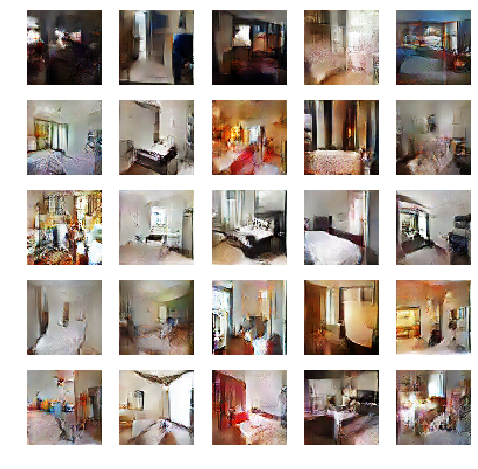

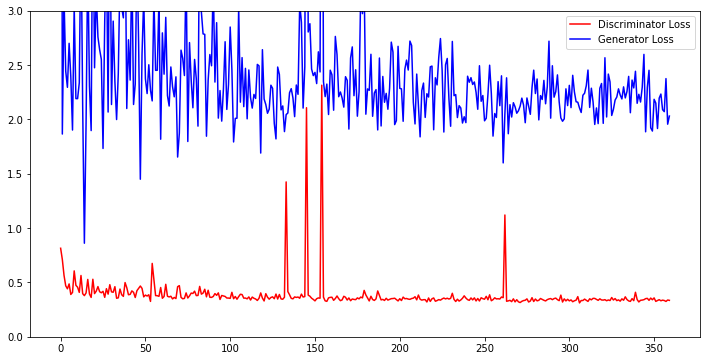

Epoch 361 of 1000
361 [D loss: 0.320019, acc.: 0.00%] [G loss: 2.361909]
Time Elapsed 8.65
Epoch 362 of 1000
362 [D loss: 0.320524, acc.: 0.00%] [G loss: 2.284315]
Time Elapsed 8.66
Epoch 363 of 1000
363 [D loss: 0.337693, acc.: 0.00%] [G loss: 2.017361]
Time Elapsed 8.68
Epoch 364 of 1000
364 [D loss: 0.336683, acc.: 0.00%] [G loss: 2.132770]
Time Elapsed 8.65
Epoch 365 of 1000
365 [D loss: 0.352295, acc.: 0.00%] [G loss: 2.005782]
Time Elapsed 8.67
Epoch 366 of 1000
366 [D loss: 0.329317, acc.: 0.00%] [G loss: 2.400471]
Time Elapsed 8.74
Epoch 367 of 1000
367 [D loss: 0.346088, acc.: 0.00%] [G loss: 1.988726]
Time Elapsed 8.68
Epoch 368 of 1000
368 [D loss: 0.328765, acc.: 0.00%] [G loss: 2.645874]
Time Elapsed 8.64
Epoch 369 of 1000
369 [D loss: 0.337170, acc.: 0.00%] [G loss: 2.298028]
Time Elapsed 8.65
Epoch 370 of 1000
370 [D loss: 0.353040, acc.: 0.00%] [G loss: 2.082260]
Time Elapsed 8.66


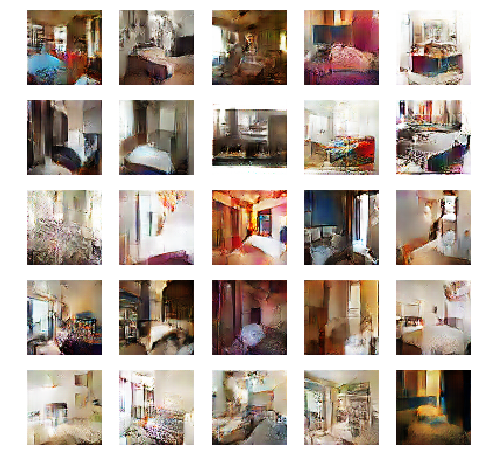

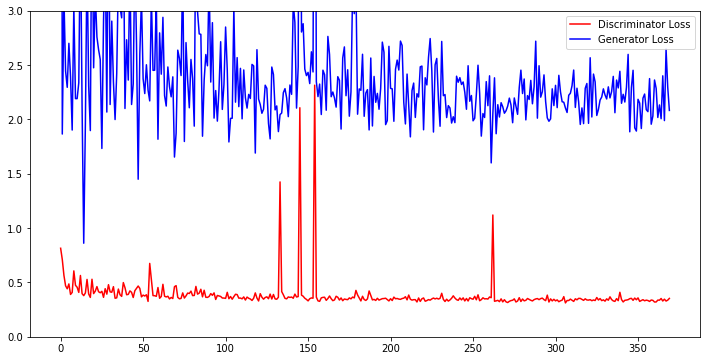

Epoch 371 of 1000
371 [D loss: 0.324843, acc.: 0.00%] [G loss: 2.312691]
Time Elapsed 8.73
Epoch 372 of 1000
372 [D loss: 0.340203, acc.: 0.00%] [G loss: 2.376873]
Time Elapsed 8.76
Epoch 373 of 1000
373 [D loss: 0.347260, acc.: 0.00%] [G loss: 1.906642]
Time Elapsed 8.75
Epoch 374 of 1000


In [ ]:
if __name__ == '__main__':
    dcgan = DCGAN(sample_size = 5000)
    dcgan.train(epochs=1000, batch_size= 64, save_interval= 10)

In [ ]:
# import numpy as np 

# def get_next_batch(idx,current_batch, no_batch, data):
#     if (current_batch +1) == no_batches:
#        idx_e = len(data)
#     else:
#        idx_e = idx + batch_size    
#     print(idx, idx_e)
#     return data[idx:idx_e], idx + batch_size


# data = [0, 1,2,3,4,5,6,7,8,9]
# batch_size = 3
# no_batches = int(len(data) / batch_size)
# idx = 0
# for current_batch in range(no_batches):
    
#     batch_data, idx = get_next_batch(idx,current_batch, no_batches, data) 
#     print(batch_data)
